# Hematopoiesis data visualization

#### load libraries

In [1]:
from __future__ import division
from scipy import stats
from collections import OrderedDict
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as col
import matplotlib.gridspec as gridspec
from matplotlib.ticker import FuncFormatter,MaxNLocator
from matplotlib import rc
import scipy.io as sio
import h5py
import math
#import webcolors
import os
import random
import matplotlib.style

#### load some functions:

In [2]:
path = os.getcwd()
os.chdir(path)
%run "defined_functions.ipynb"

In [3]:
path

'D:\\Documents\\MATLAB\\HematopoieticDisorderAnalysis\\Python\\data_analysis'

#### specify if graphics should be saved:

In [4]:
opt_save = True

#### specify settings for plt graphics

In [5]:
loadPltSettings(25,20) #fontSize,markerSize

<module 'matplotlib.pyplot' from 'C:\\Users\\PowerWS\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

#### define colors

In [6]:
sns.set(style="whitegrid")
col_H = '#194795'
col_H_light = '#0F2F66'
col_H_y = '#57B8F9'
col_H_y_light = '#279DEC'
col_H_a = '#194795'
col_H_a_light = '#0F2F66'
col_MDS = '#C61D1D'
col_MDS_light = '#791010'
col_MDS_m1 = '#FD8002'
col_MDS_m2 = '#AD07E3'
col_MDS_m3 = '#FF0000'
col_MDS_m4 = '#FF3399'
col_MDS_m5 = '#813434'
col_MDS_m6 = '#FF0010'
col_MDS_m7 = '#813437'
col_MDS_m8 = '#834537'
col_CHIP = '#009999'
col_CHIP_light = '#00FFFF'

cols_H_vs_MDS = sns.color_palette([col_H,col_MDS])
cols_H_vs_MDS_light = sns.color_palette([col_H_light,col_MDS_light])
cols_H_vs_MDS_mut = sns.color_palette([col_H,col_MDS,col_MDS_m1,col_MDS_m2,col_MDS_m3,col_MDS_m4,col_MDS_m5,col_MDS_m6,col_MDS_m7,col_MDS_m8])

cols_H_y_vs_MDS = sns.color_palette([col_H_y,col_MDS])
cols_H_y_vs_MDS_light = sns.color_palette([col_H_y_light,col_MDS_light])

cols_H_y_vs_H_a = sns.color_palette([col_H_y, col_H_a])
cols_H_y_vs_H_a_light = sns.color_palette([col_H_y_light, col_H_a_light])

cols_H_y_vs_H_a_vs_MDS = sns.color_palette([col_H_y, col_H_a, col_MDS])
cols_H_y_vs_H_a_vs_MDS_light = sns.color_palette([col_H_y_light, col_H_a_light, col_MDS_light])

cols_CHIP_vs_MDS = sns.color_palette([col_CHIP,col_MDS])
cols_CHIP_vs_MDS_light = sns.color_palette([col_CHIP_light,col_MDS_light])

cols_H_vs_CHIP = sns.color_palette([col_H,col_CHIP])
cols_H_vs_CHIP_light = sns.color_palette([col_H_light,col_CHIP_light])

cols_H_vs_CHIP_vs_MDS = sns.color_palette([col_H,col_CHIP,col_MDS])
cols_H_vs_CHIP_vs_MDS_light = sns.color_palette([col_H_light,col_CHIP_light,col_MDS_light])

cols_status_3 = sns.color_palette([col_H_y_light,col_H_a_light,col_MDS_light])
cols_status_light_3 = sns.color_palette([col_H_y,col_H_a,col_MDS])

cols_BMtype_3 = sns.color_palette(['#009999','#99004C','#CC6600'])
cols_BMtype_light_3 = sns.color_palette(['#00FFFF','#FF007F','#FF9933'])

cols_CT = sns.color_palette(['#CC0000','#FF8000','#003366','#6600CC','#00994C','#57D7F7','#FFE00E','#A0A0A0']);
#division plots
cols_divisions = sns.color_palette(["navy","teal","lightseagreen","yellowgreen","gold","orange","tomato","darkred","purple","orchid","dimgrey","darkgrey"])

#### define marker symbols

In [7]:
marker_MDS = 'o'
marker_H_y = 's'
marker_H_a = '^'
marker_CHIP = 's'

#### define groups, Cell types of interest, mutation of interest, samples excluded

In [8]:
Groups=['healthy','CHIP','MDS','healthy age-matched','healthy young','healthy aged']
CT_str=['HSC','MPP','MLP','CMP','GMP','MEP','mature','all cells']
mutations_of_interest_str = ''
opt_mutations_of_interest = 'combined'
#opt_mutations_of_interest = 'stemCellLevel'
samples_excluded_MDS = ["110","433","173","215","460","592","545"]
samples_excluded_H = ["450","425","729","754"]

#### load data

In [9]:
df_FACS, df_PD, df, df_divs_F_all, df_divs_all,mutation_str = load_data_frames(CT_str, samples_excluded_H, samples_excluded_MDS, Groups, opt_mutations_of_interest, mutations_of_interest_str)

(132, 342)
(50, 342)
(62, 342)
(81, 342)
(51, 342)
(81, 342)


In [10]:
np.unique(df['Sample_ID'])

array(['H311', 'H312', 'H345', 'H348', 'H353', 'H370', 'H380', 'H391',
       'H439', 'H482', 'H500', 'H508', 'H519', 'H520', 'H522', 'H547',
       'H552', 'H559', 'H560', 'H561', 'H607', 'H657', 'H775', 'H791',
       'MDS135', 'MDS140', 'MDS227', 'MDS279', 'MDS326', 'MDS354',
       'MDS360', 'MDS373', 'MDS377', 'MDS620'], dtype=object)

In [11]:
#df_FACS.head()
#df_PD.head()
#df.head()
#df_divs_F_all.head() 
#df_divs_all['Group'].unique()

In [12]:
#df[['Sample_ID','Mutation_counts']].get_values()

In [13]:
#df[df['Sample_ID']=='H561'][['Sample_ID','TP53_VAF']]

In [14]:
#np.any(df[mutation_str+'_VAF'].get_values().astype(np.float)>0,axis=1)

### Pie charts of individual samples

In [15]:
#df[df['sample_name']=='552_1']

In [16]:
path = os.getcwd()
os.chdir(path)
%run "defined_functions.ipynb"

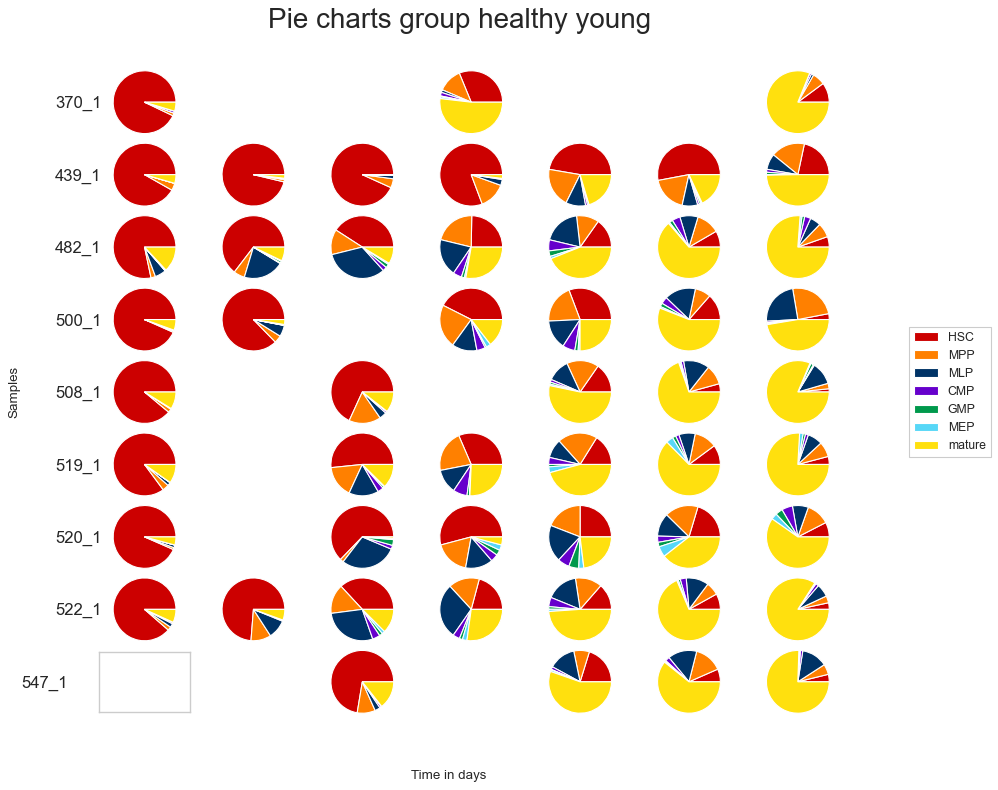

<Figure size 640x480 with 0 Axes>

In [17]:
plot_pie_charts_of_single_samples(df,'healthy young',CT_str[:-1],cols_CT,mutation_str,opt_save)

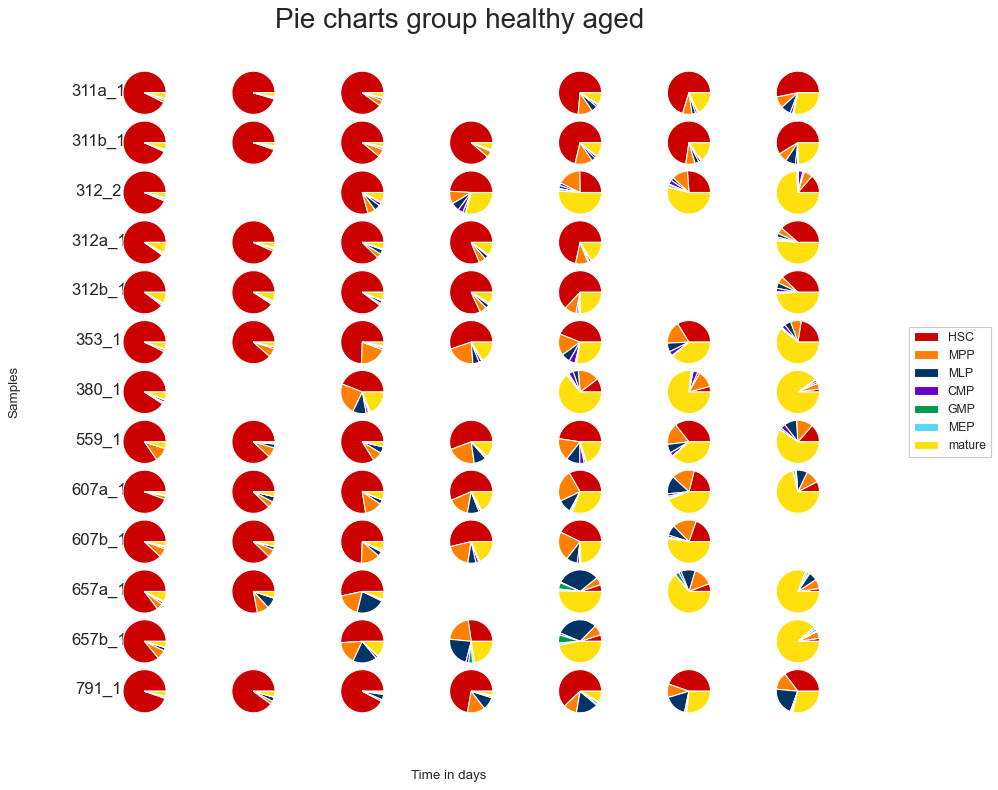

<Figure size 640x480 with 0 Axes>

In [18]:
plot_pie_charts_of_single_samples(df,'healthy aged',CT_str[:-1],cols_CT,mutation_str,opt_save)

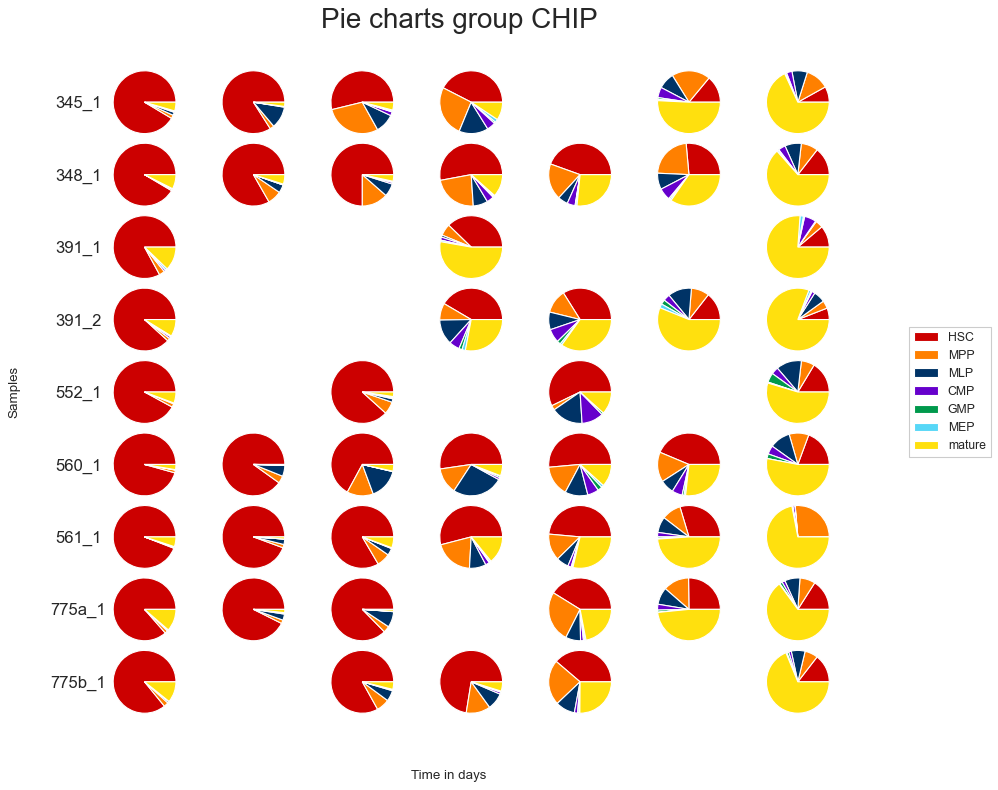

<Figure size 640x480 with 0 Axes>

In [19]:
plot_pie_charts_of_single_samples(df,'CHIP',CT_str[:-1],cols_CT,mutation_str,opt_save)

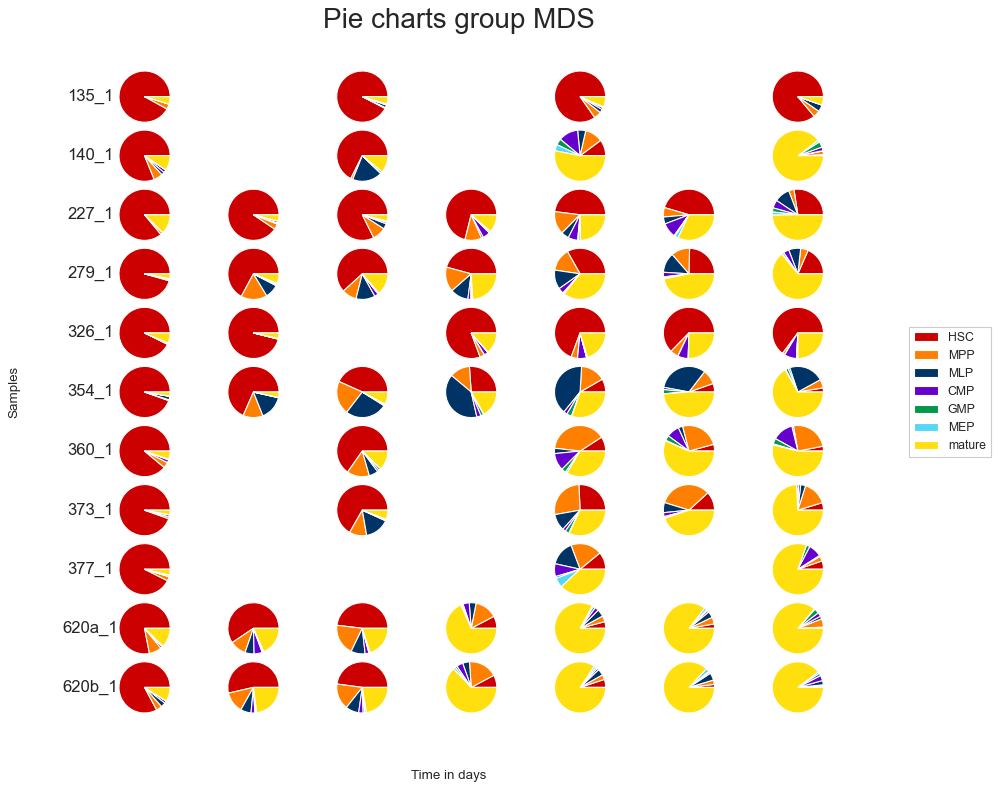

<Figure size 640x480 with 0 Axes>

In [20]:
plot_pie_charts_of_single_samples(df,'MDS',CT_str[:-1],cols_CT,mutation_str,opt_save)

### Age distribution of individuals

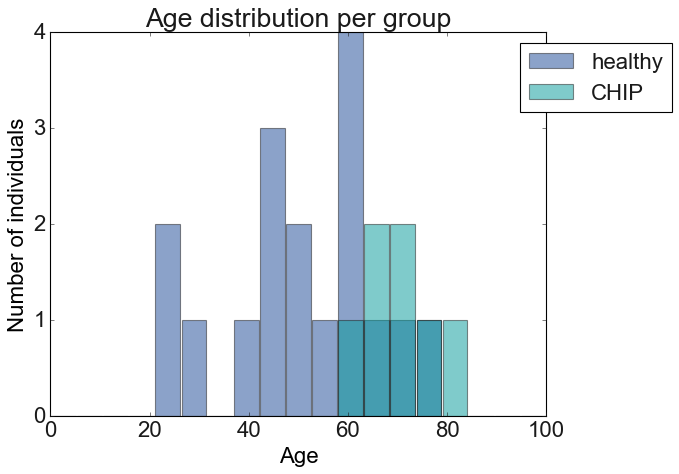

<Figure size 640x480 with 0 Axes>

In [21]:
loadPltSettings(20,20) #fontSize,markerSize
plot_age_distributions(df,['healthy','CHIP'],cols_H_vs_CHIP,opt_save)

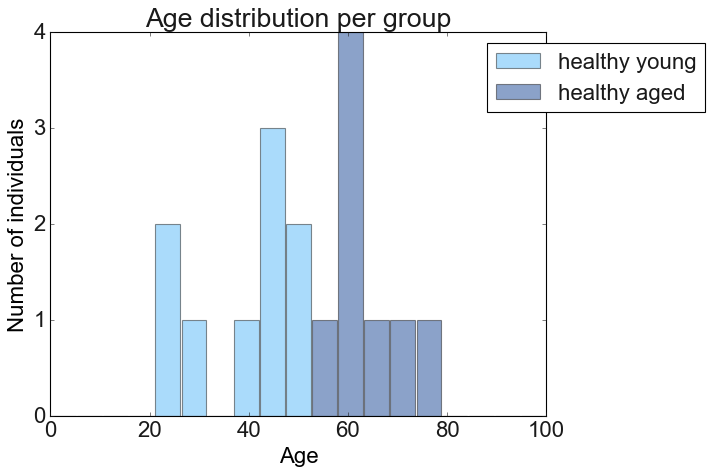

<Figure size 640x480 with 0 Axes>

In [22]:
plot_age_distributions(df,['healthy young','healthy aged'],cols_H_y_vs_H_a,opt_save)

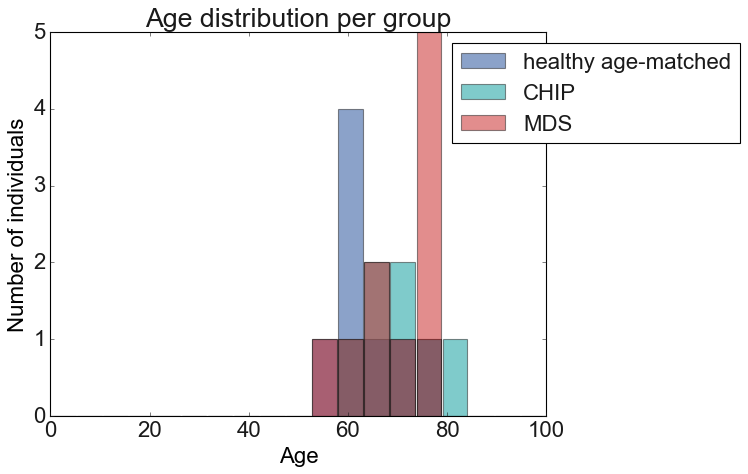

<Figure size 640x480 with 0 Axes>

In [23]:
plot_age_distributions(df,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,opt_save)

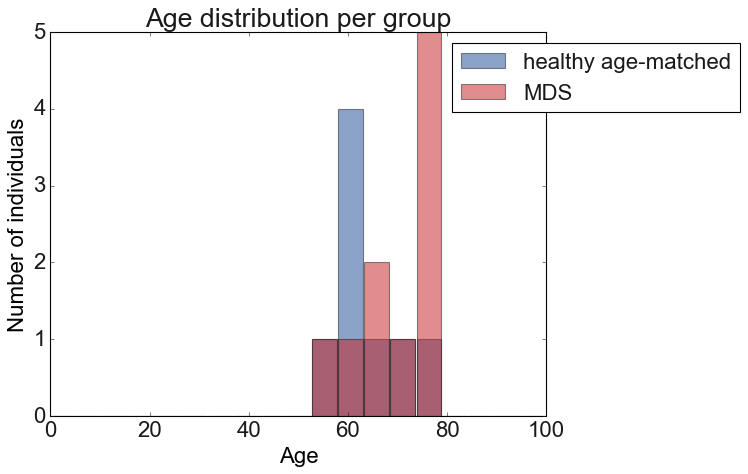

<Figure size 640x480 with 0 Axes>

In [24]:
plot_age_distributions(df,['healthy age-matched','MDS'],cols_H_vs_MDS,opt_save)

### Plot samples
#### a) plot samples grouped by Status_detailed (with color code):

1. Specify transformation of data

In [25]:
transf = 'log10'

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The

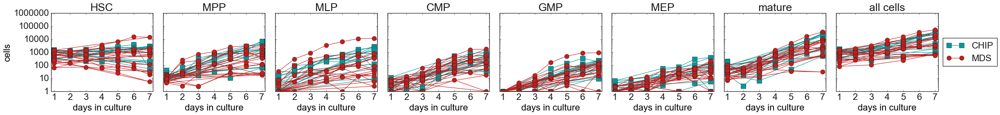

<Figure size 640x480 with 0 Axes>

In [26]:
loadPltSettings(20,10) #fontSize,markerSize
plot_all_samples(df,CT_str,transf,['CHIP','MDS'],cols_CHIP_vs_MDS,[marker_CHIP,marker_MDS],False,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The

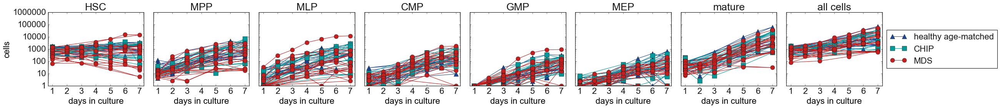

<Figure size 640x480 with 0 Axes>

In [27]:
loadPltSettings(20,10) #fontSize,markerSize
plot_all_samples(df,CT_str,transf,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,[marker_H_a,marker_CHIP,marker_MDS],False,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The

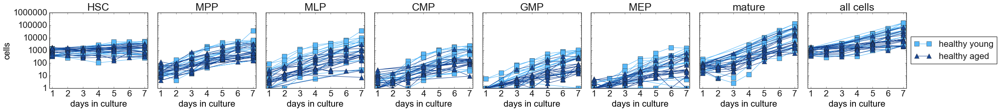

<Figure size 640x480 with 0 Axes>

In [28]:
loadPltSettings(20,10) #fontSize,markerSize
plot_all_samples(df,CT_str,transf,['healthy young','healthy aged'],cols_H_y_vs_H_a,[marker_H_y,marker_H_a],False,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name 

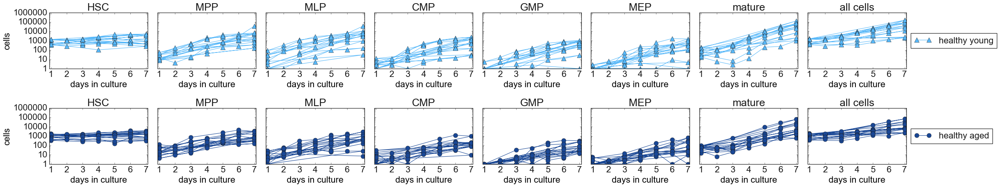

<Figure size 640x480 with 0 Axes>

In [29]:
plot_all_samples(df,CT_str,transf,['healthy young','healthy aged'],cols_H_y_vs_H_a,[marker_H_a,marker_MDS],True,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The

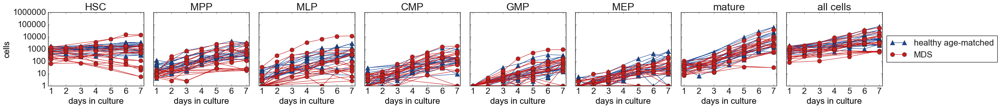

<Figure size 640x480 with 0 Axes>

In [30]:
plot_all_samples(df,CT_str,transf,['healthy age-matched','MDS'],cols_H_vs_MDS,[marker_H_a,marker_MDS],False,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:63: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name 

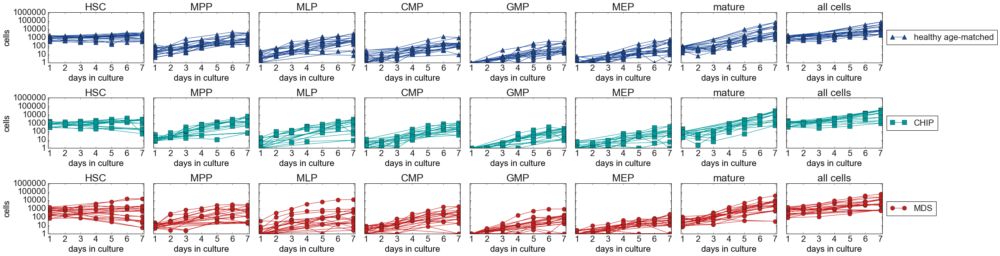

<Figure size 640x480 with 0 Axes>

In [31]:
plot_all_samples(df,CT_str,transf,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,[marker_H_a,marker_CHIP,marker_MDS],True,opt_save)

#### b) Plot single samples

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name 

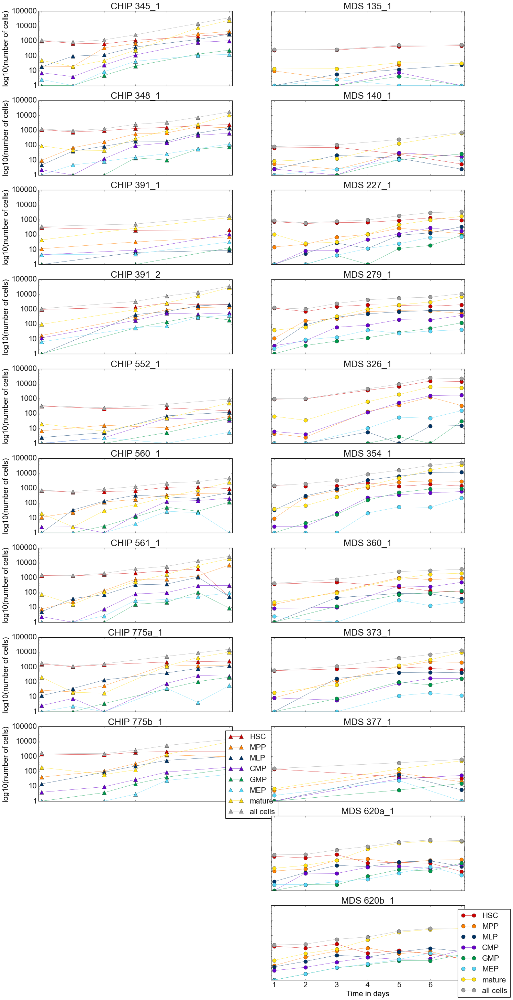

<Figure size 640x480 with 0 Axes>

In [32]:
plot_single_samples_of2groups(df,['CHIP','MDS'],transf,CT_str,cols_CT,[marker_H_a,marker_MDS],opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name 

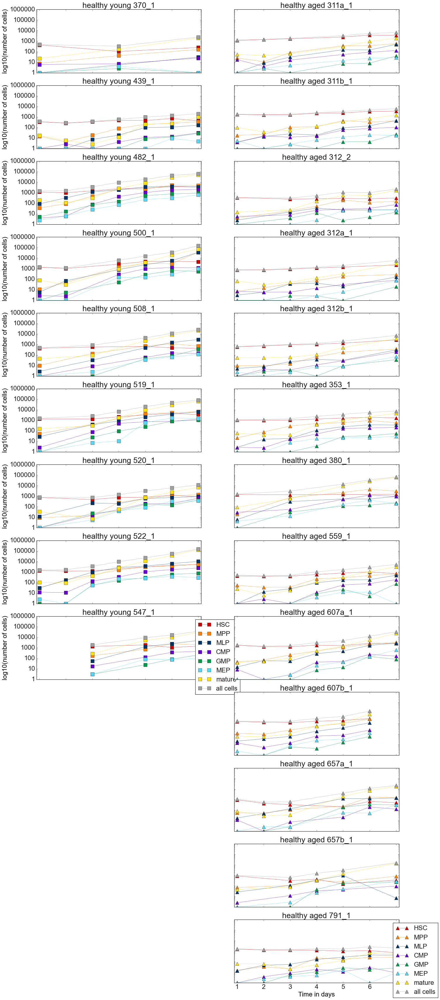

<Figure size 640x480 with 0 Axes>

In [33]:
plot_single_samples_of2groups(df,['healthy young','healthy aged'],transf,CT_str,cols_CT,[marker_H_y,marker_H_a],opt_save)

In [34]:
#plot_single_samples_of2groups(df,['H_age_matched','MDS'],transf,['HSC'],cols_CT)

### Plot relative count of BM cells at day 7 per cell type

In [35]:
CT_str_red=['HSC','MPP','MLP','CMP','GMP','MEP']
FS=[35,25,20]
#opt_test = 'Kruskal_Wallis'
opt_test = 'Kolmogorov_Smirnov'
#opt_test = ''

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Fraction_BM_cells_day7_H_y_vs_H_a_vs_MDS_test.svg


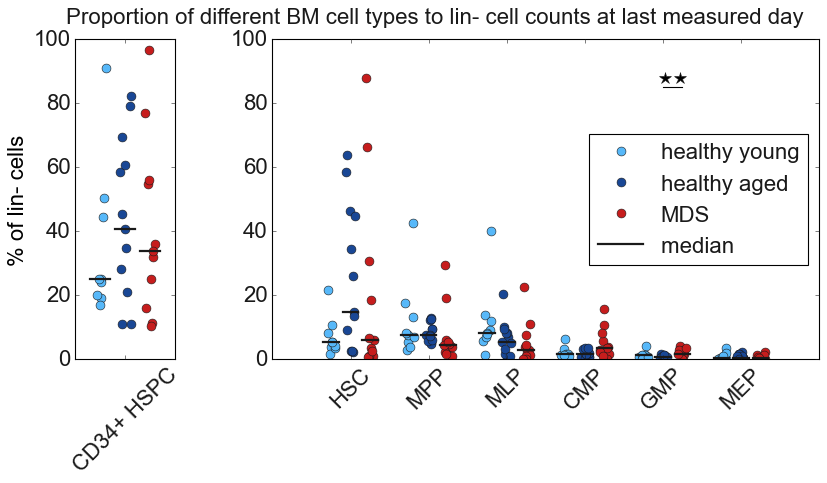

<Figure size 640x480 with 0 Axes>

In [36]:
#normalisierung komisch --> lin neg correction
G=['healthy young', 'healthy aged', 'MDS']
add_file_str = '_H_y_vs_H_a_vs_MDS'
F = plot_fraction_Of_BM_cells_day7(df,cols_H_y_vs_H_a_vs_MDS,cols_H_y_vs_H_a_vs_MDS_light,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Fraction_BM_cells_day7_H_age_matched_vs_CHIP_vs_MDS_test.svg


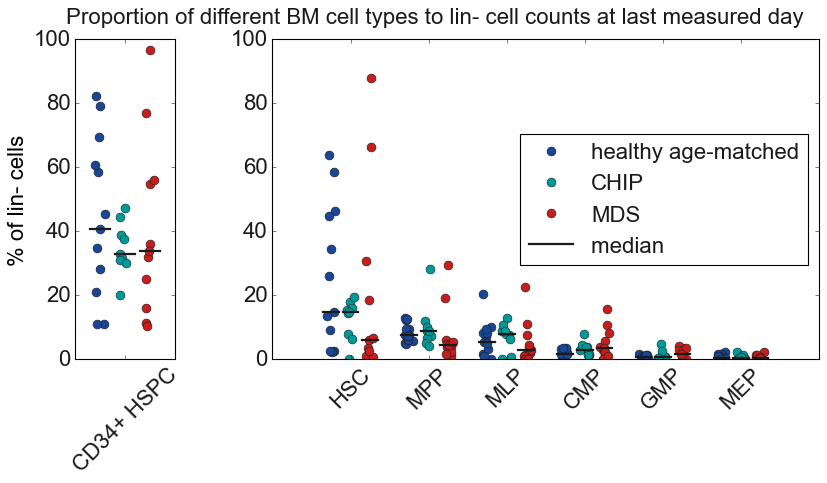

<Figure size 640x480 with 0 Axes>

In [37]:
G=['healthy age-matched','CHIP','MDS']
add_file_str = '_H_age_matched_vs_CHIP_vs_MDS'
F = plot_fraction_Of_BM_cells_day7(df,cols_H_vs_CHIP_vs_MDS,cols_H_vs_CHIP_vs_MDS_light,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

In [38]:
os.chdir(path)
%run "defined_functions.ipynb"

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Fraction_BM_cells_day7_H_y_vs_H_a_test.svg


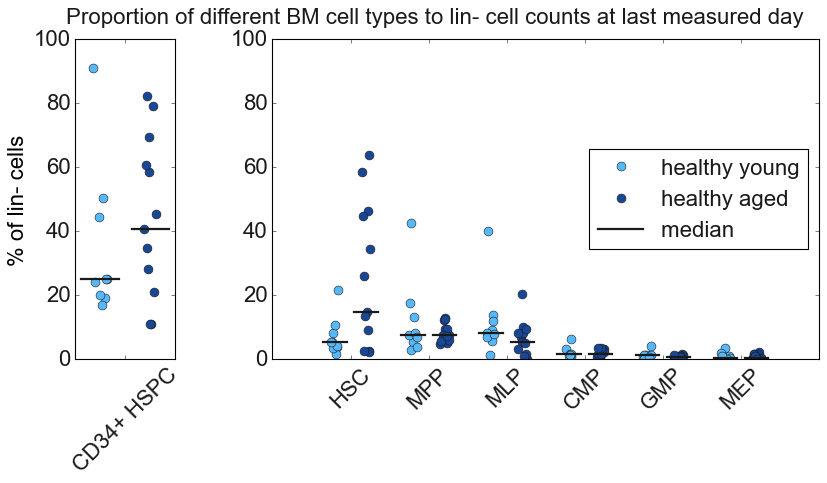

<Figure size 640x480 with 0 Axes>

In [39]:
G=['healthy young', 'healthy aged']
add_file_str = '_H_y_vs_H_a'
F = plot_fraction_Of_BM_cells_day7(df,cols_H_y_vs_H_a,cols_H_y_vs_H_a_light,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


6
0.04135257815244734
Fraction_BM_cells_day7_H_age_matched_vs_MDS_test.svg


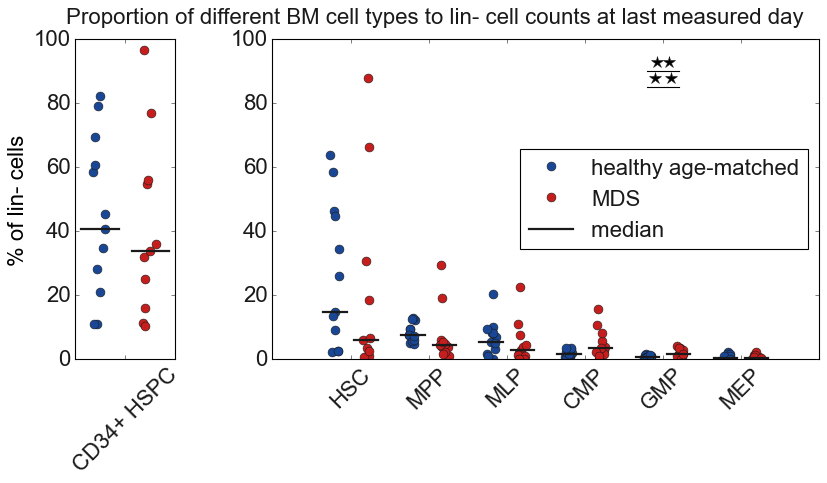

<Figure size 640x480 with 0 Axes>

In [40]:
G=['healthy age-matched','MDS']
add_file_str = '_H_age_matched_vs_MDS'
F = plot_fraction_Of_BM_cells_day7(df,cols_H_vs_MDS,cols_H_vs_MDS_light,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Fraction_BM_cells_day7_BM_type_test.svg


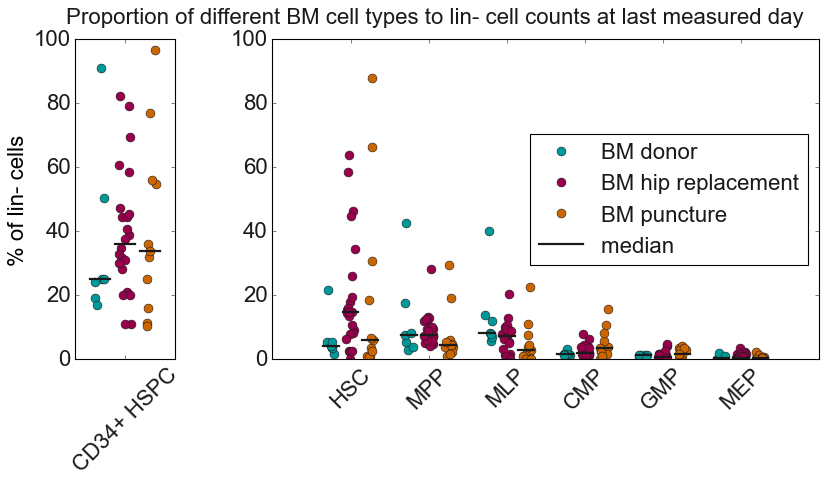

<Figure size 640x480 with 0 Axes>

In [41]:
G=['BM donor', 'BM hip replacement', 'BM puncture']
add_file_str = '_BM_type'
F = plot_fraction_Of_BM_cells_day7(df,cols_BMtype_3,cols_BMtype_light_3,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


Fraction_BM_cells_day7_BM_type_healthy_test.svg


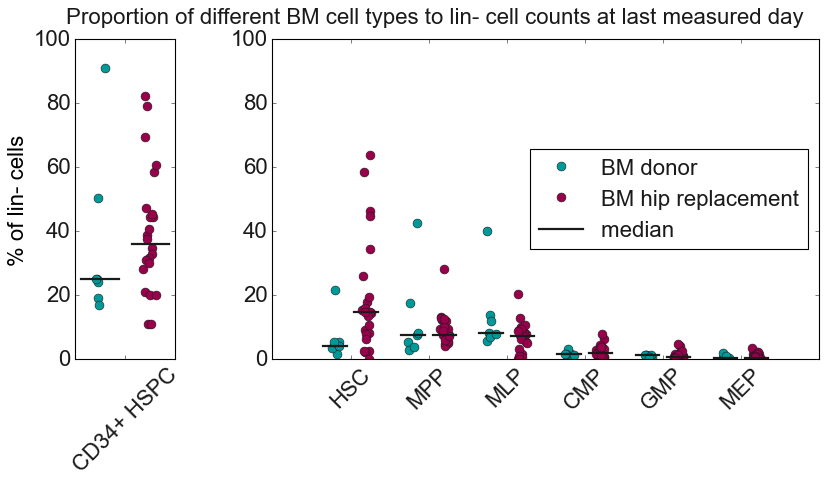

<Figure size 640x480 with 0 Axes>

In [42]:
G=['BM donor', 'BM hip replacement']
add_file_str = '_BM_type_healthy'
F = plot_fraction_Of_BM_cells_day7(df,cols_BMtype_3,cols_BMtype_light_3,CT_str_red,G,add_file_str,mutation_str,opt_test,opt_save)

In [43]:
os.chdir(path)
%run "defined_functions.ipynb"

(1, 22)
(1, 22)
HSPC:
rho= 0.3227486433362384
one-sided p-value= 0.07146044143455547
corrected one-sided p-value= 0.07146044143455547


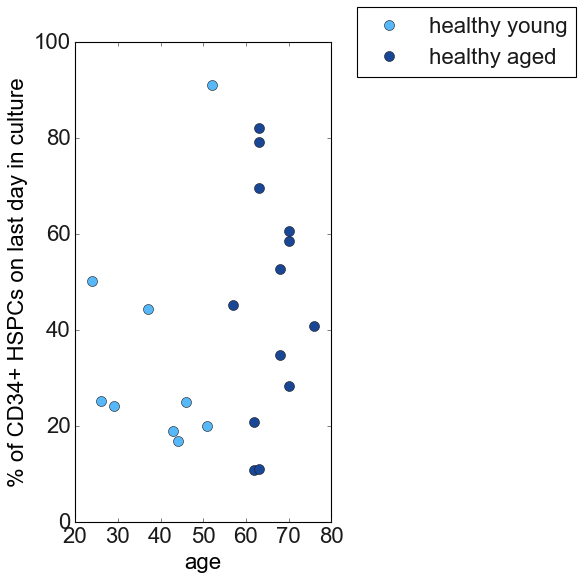

<Figure size 640x480 with 0 Axes>

In [44]:
transf = 'lin'
G=['healthy young','healthy aged']
CT_interest = ['HSPC']
plot_fraction_Of_BM_cells_last_day_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

(7, 22)
(1, 22)
HSC:
rho= 0.4600160803966422
one-sided p-value= 0.015614251165178738
corrected one-sided p-value= 0.10929975815625116
MPP:
rho= 0.07203704341599698
one-sided p-value= 0.37502445747279023
corrected one-sided p-value= 2.6251712023095317
MLP:
rho= -0.1871828687187323
one-sided p-value= 0.20210477211049777
corrected one-sided p-value= 1.4147334047734843
CMP:
rho= 0.2331277546769666
one-sided p-value= 0.14821660750697654
corrected one-sided p-value= 1.0375162525488357
GMP:
rho= -0.30176147320716845
one-sided p-value= 0.08615238352720775
corrected one-sided p-value= 0.6030666846904542
MEP:
rho= 0.12198692006161727
one-sided p-value= 0.29432363453108573
corrected one-sided p-value= 2.0602654417176
mature:
rho= -0.20476671396200716
one-sided p-value= 0.1803276791668273
corrected one-sided p-value= 1.262293754167791


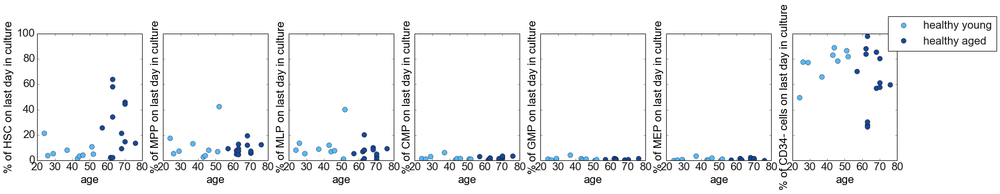

<Figure size 640x480 with 0 Axes>

In [45]:
transf = 'lin'
G=['healthy young','healthy aged']
CT_interest = ['HSC','MPP','MLP','CMP','GMP','MEP','mature']
plot_fraction_Of_BM_cells_last_day_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

### Plot yield after 7 days
number of mature cells or progenitors day 7 per HSCs day 1 

In [46]:
loadPltSettings(18,10)
path = os.getcwd()
os.chdir(path)
%run "defined_functions.ipynb"

['482' '500' '508' '519' '522']
['380']
HSPC Kruskal Wallis p-val:
0.026885511853408057
Mann Whitney U-test HSPC: 
p-value group 1 vs. 2: 0.01519141098828875
Kolmogorov Smirnov test HSPC: 
p-value group 1 vs. 2: 0.0021390374331550803
Mann Whitney U-test mature: 
p-value group 1 vs. 2: 0.030300984856003035
Kolmogorov Smirnov test mature: 
p-value group 1 vs. 2: 0.054709995886466474


C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:98: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:99: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  I

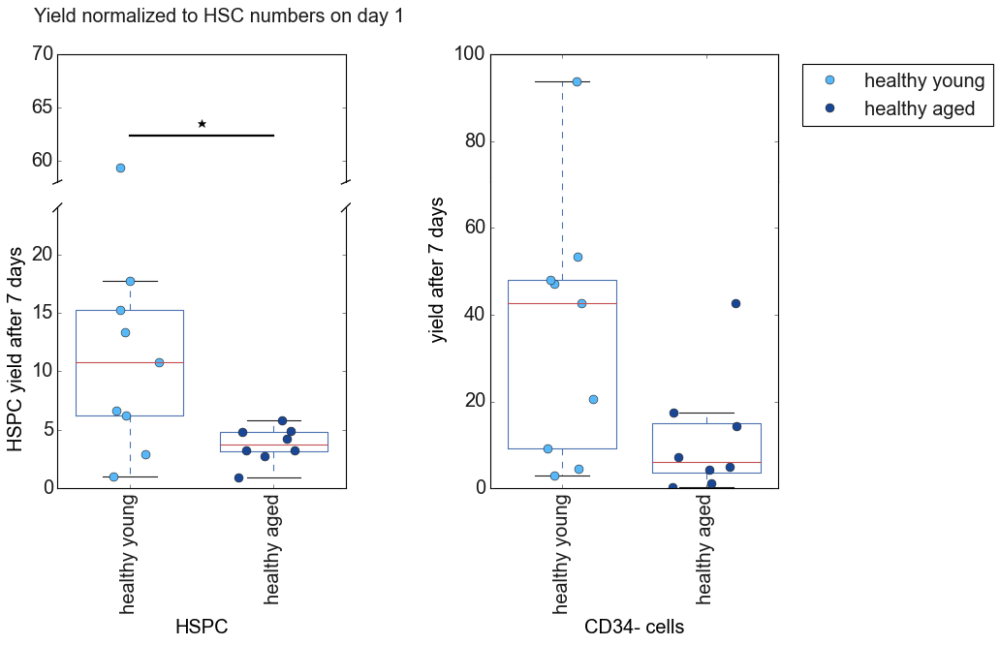

<Figure size 640x480 with 0 Axes>

In [47]:
transf = 'lin'
G = ['healthy young','healthy aged']
add_file_str = '_H_y_vs_a'
opt_test = True
CT_interest = ['HSPC','mature']
#CT_interest = ['HSC','HSPC','mature']
#CT_interest = ['HSC','MPP','MLP','CMP','MEP','GMP','mature']
bool_rep_averaged = True
plot_yield_after7days(df,G,mutation_str,cols_H_y_vs_H_a_vs_MDS,CT_interest,CT_str,transf,opt_test,add_file_str,True,bool_rep_averaged,opt_save)

['380']
[]
Kolmogorov Smirnov test HSPC: 
p-value group 1 vs. 2: 0.37785090726267195
Kolmogorov Smirnov test mature: 
p-value group 1 vs. 2: 0.6810868869692399
Kolmogorov Smirnov test HSC: 
p-value group 1 vs. 2: 0.8748343160107867


C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:98: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  

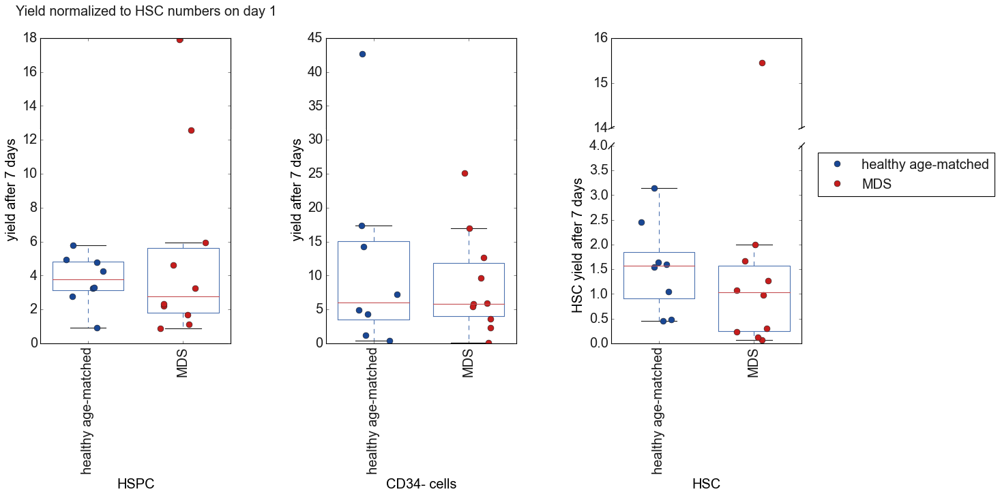

<Figure size 640x480 with 0 Axes>

In [48]:
transf = 'lin'
G = ['healthy age-matched','MDS']
add_file_str = '_H_agematched_vs_MDS'
CT_interest = ['HSPC','mature','HSC']
#CT_interest = ['HSPC','HSC','MPP','MLP','CMP','MEP','GMP','mature']
bool_rep_averaged = True
plot_yield_after7days(df,G,mutation_str,cols_H_vs_MDS,CT_interest,CT_str,transf,opt_test,add_file_str,True,bool_rep_averaged,opt_save)

GMP
657
0.30233630279483986
[nan nan nan nan nan nan nan nan nan nan nan nan]
----------
[]
CMP
326
1.8737307705338702
['high risk (5)' 'int-II (1.5)']
----------
CMP
360
1.3207265794725322
['int-I (1)' 'intermediate risk (4.5)']
----------
GMP
140
0.3857939717776621
['high (3)' 'very high (7)']
----------
GMP
354
0.6330968123659113
['low (0)' 'low risk (2)']
----------
GMP
360
0.3549452682332423
['int-I (1)' 'intermediate risk (4.5)']
----------
GMP
373
0.2911483539649035
['int-I (0.5)' 'intermediate risk (4)']
----------
GMP
620
0.31663836233140225
['low (0)' 'low risk (2)']
----------
[]
Kolmogorov Smirnov test CMP: 
p-value group 1 vs. 2: 0.015128662187485717
Kolmogorov Smirnov test GMP: 
p-value group 1 vs. 2: 0.14779011837835368


C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


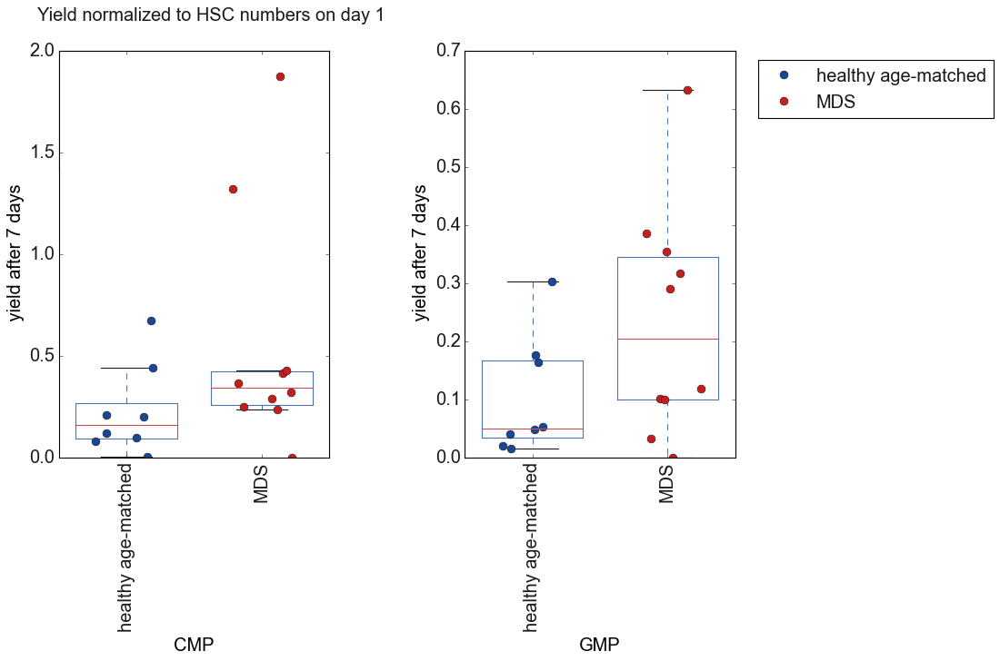

<Figure size 640x480 with 0 Axes>

In [49]:
transf = 'lin'
G = ['healthy age-matched','MDS']
add_file_str = '_H_agematched_vs_MDS'
#CT_interest = ['HSPC','mature','HSC']
CT_interest = ['CMP','GMP']
bool_rep_averaged = True
plot_yield_after7days(df,G,mutation_str,cols_H_vs_MDS,CT_interest,CT_str,transf,opt_test,add_file_str,False,bool_rep_averaged,opt_save)

['380']
[]


C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:98: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  

[]


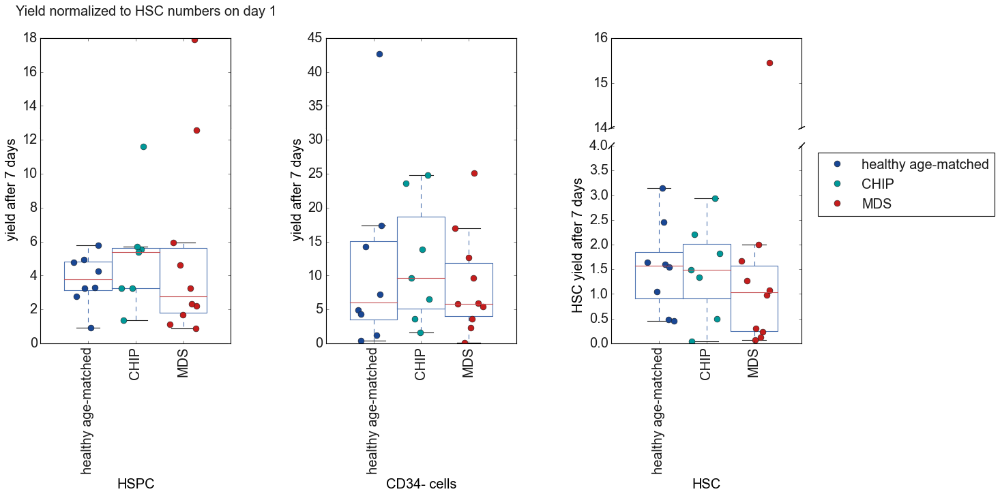

<Figure size 640x480 with 0 Axes>

In [50]:
transf = 'lin'
G = ['healthy age-matched','CHIP','MDS']
add_file_str = '_H_agematched_vs_CHIP_vs_MDS'
CT_interest = ['HSPC','mature','HSC']
#CT_interest = ['HSPC','HSC','MPP','MLP','CMP','MEP','GMP','mature']
bool_rep_averaged = True
plot_yield_after7days(df,G,mutation_str,cols_H_vs_CHIP_vs_MDS,CT_interest,CT_str,transf,opt_test,add_file_str,True,bool_rep_averaged,opt_save)

['500']
[]


C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:185: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance. 

[]


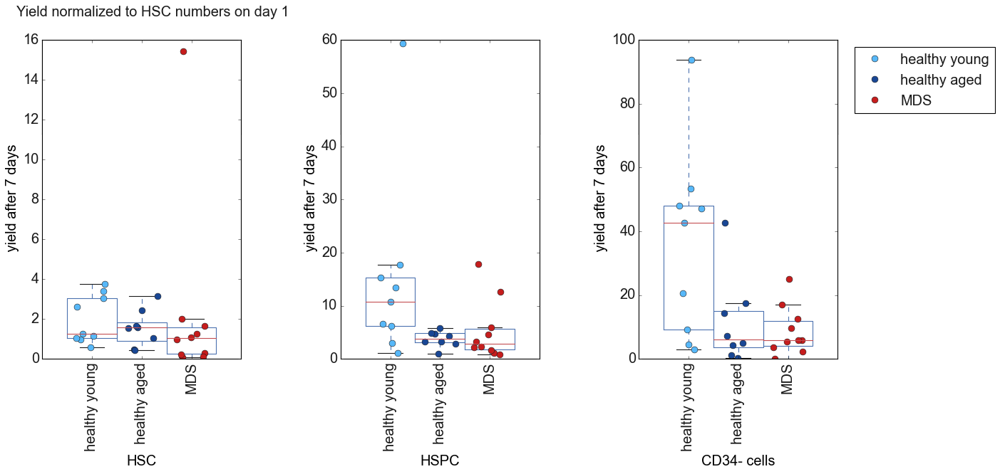

<Figure size 640x480 with 0 Axes>

In [51]:
transf = 'lin'
G = ['healthy young','healthy aged','MDS']
add_file_str = 'H_y_vs_a_vs_MDS'
CT_interest = ['HSC','HSPC','mature']
#CT_interest = ['HSPC','HSC','MPP','MLP','CMP','MEP','GMP','mature']
plot_yield_after7days(df,G,mutation_str,cols_H_y_vs_H_a_vs_MDS,CT_interest,CT_str,transf,opt_test,add_file_str,True,bool_rep_averaged,opt_save)

#### Yield vs age

In [52]:
transf = 'lin'
G = ['healthy young','healthy aged']
add_file_str = '_H_y_vs_a'
CT_interest = ['HSPC','mature']
loadPltSettings(16,10)

<module 'matplotlib.pyplot' from 'C:\\Users\\PowerWS\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [53]:
os.chdir(path)
%run "defined_functions.ipynb"

(2, 22)
(1, 22)
HSPC:
rho= -0.3647229835943784
p-value= 0.04756812772049319
corrected p-value= 0.09513625544098638
mature:
rho= -0.3789035039518581
p-value= 0.041017789011662094
corrected p-value= 0.08203557802332419


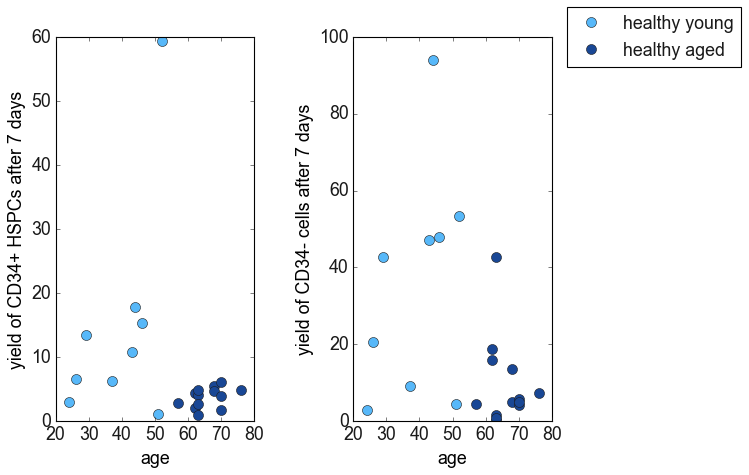

<Figure size 640x480 with 0 Axes>

In [54]:
plot_yield_after7days_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

In [58]:
#CT_interest = ['HSC','MPP','MLP','CMP','MEP','GMP','mature']
#plot_yield_after7days_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

In [60]:
#CT_interest = ['HSC','MPP','MLP']
#plot_yield_after7days_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

In [61]:
#CT_interest = ['CMP','MEP','GMP','mature']
#plot_yield_after7days_vs_age(df,G,mutation_str,cols_H_y_vs_H_a,CT_interest,CT_str,transf,opt_save)

#### Fraction of HSCs vs age

In [62]:
loadPltSettings(15,10) 

<module 'matplotlib.pyplot' from 'C:\\Users\\PowerWS\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

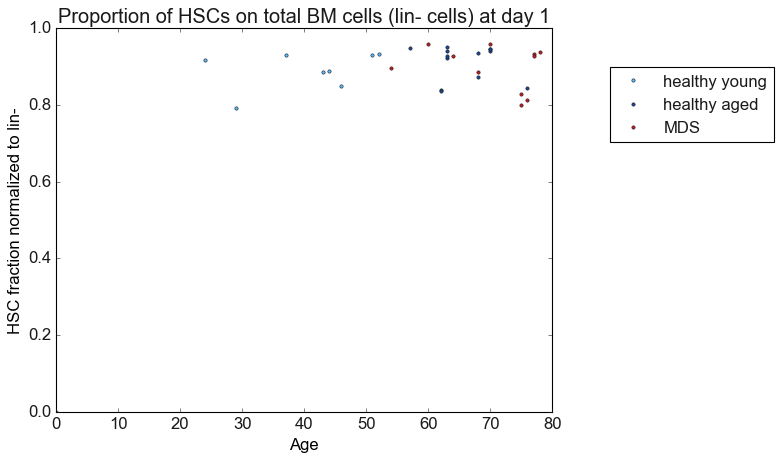

<Figure size 640x480 with 0 Axes>

In [63]:
day=1
G=['healthy young', 'healthy aged', 'MDS']
add_file_str = '_H_y_a_MDS'
plot_fraction_Of_HSCs_at_specific_day_vs_age(df,cols_H_y_vs_H_a_vs_MDS,G,day,add_file_str,opt_save)

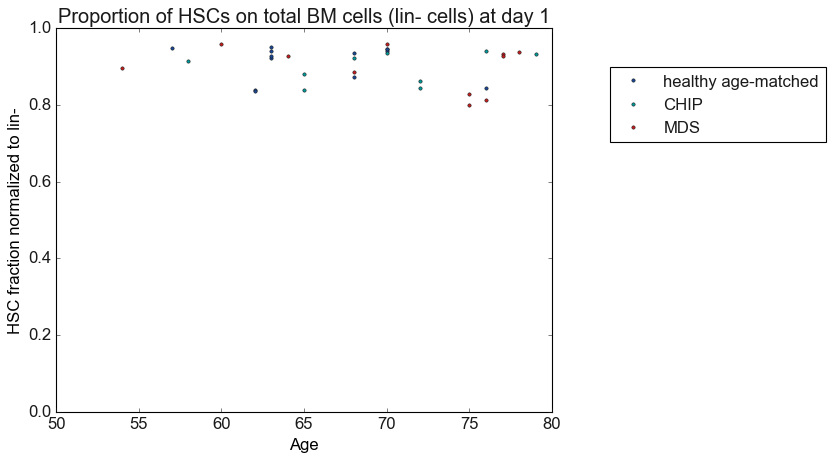

<Figure size 640x480 with 0 Axes>

In [64]:
G=['healthy age-matched','CHIP','MDS']
add_file_str = '_H_CHIP_MDS'
plot_fraction_Of_HSCs_at_specific_day_vs_age(df,cols_H_vs_CHIP_vs_MDS,G,day,add_file_str,opt_save)

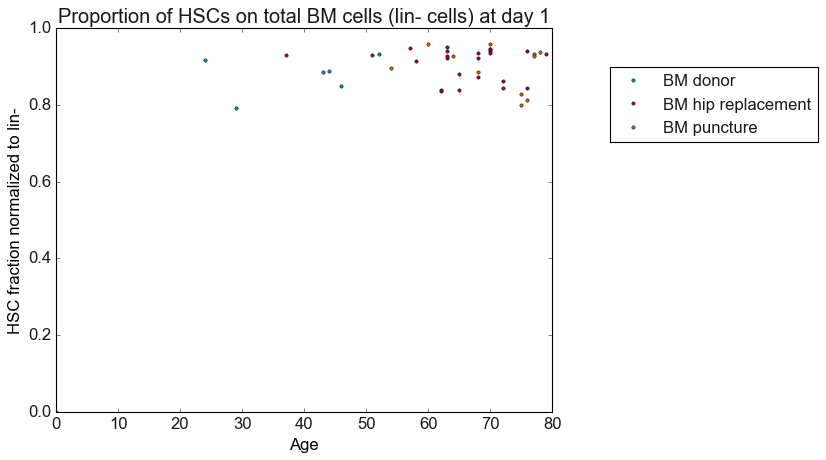

<Figure size 640x480 with 0 Axes>

In [65]:
G=['BM donor', 'BM hip replacement', 'BM puncture']
add_file_str = '_BM_type'
plot_fraction_Of_HSCs_at_specific_day_vs_age(df,cols_BMtype_3,G,day,add_file_str,opt_save)

### Number/ fraction of HSCs per Sample in bar plot (stacked for number of divisions)
(takes a couple of minutes to run)

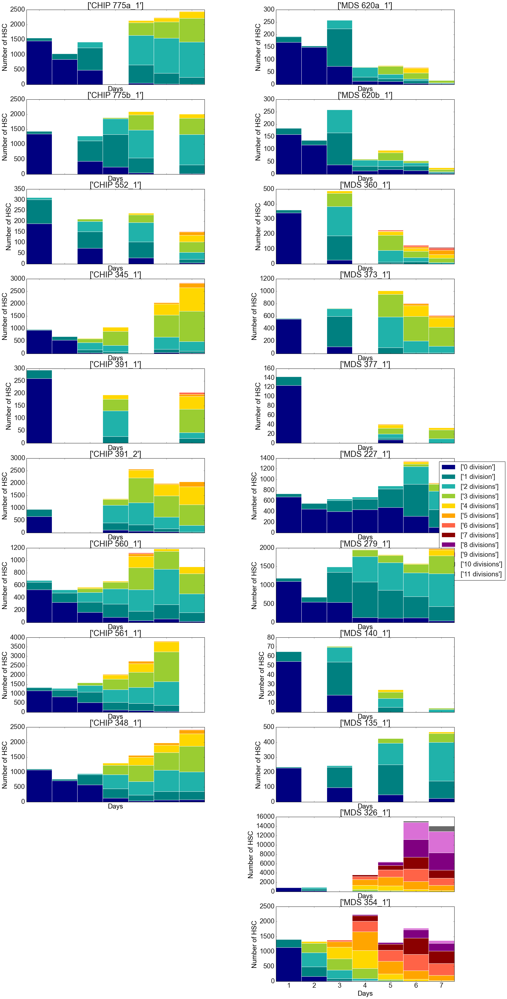

<Figure size 640x480 with 0 Axes>

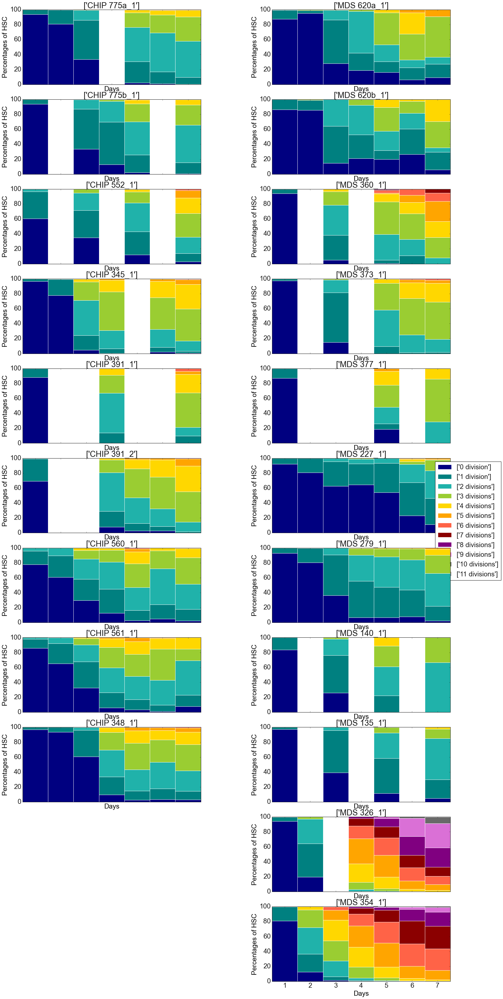

<Figure size 640x480 with 0 Axes>

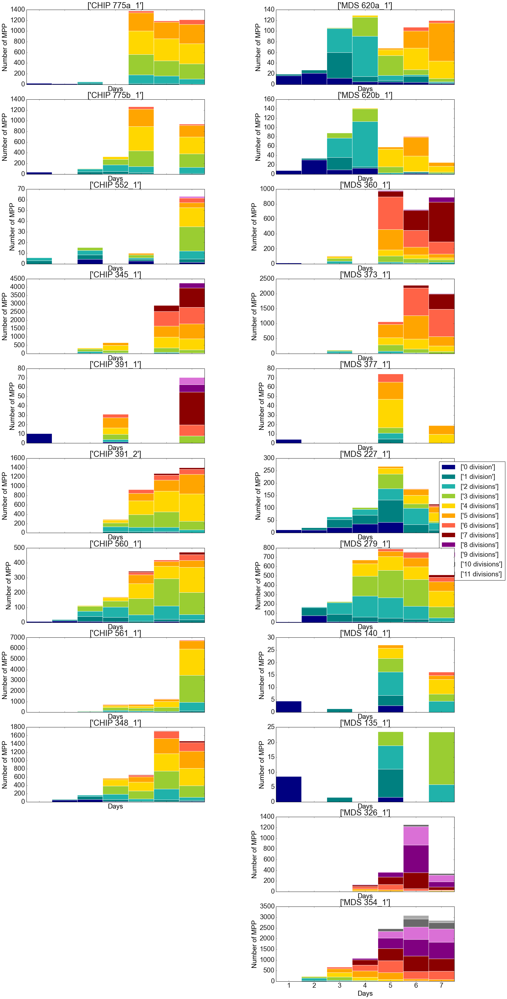

<Figure size 640x480 with 0 Axes>

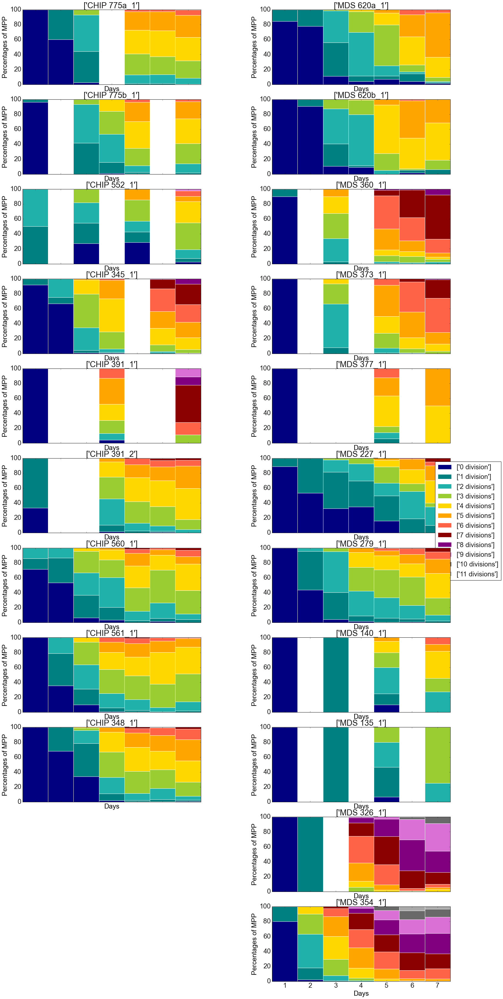

<Figure size 640x480 with 0 Axes>

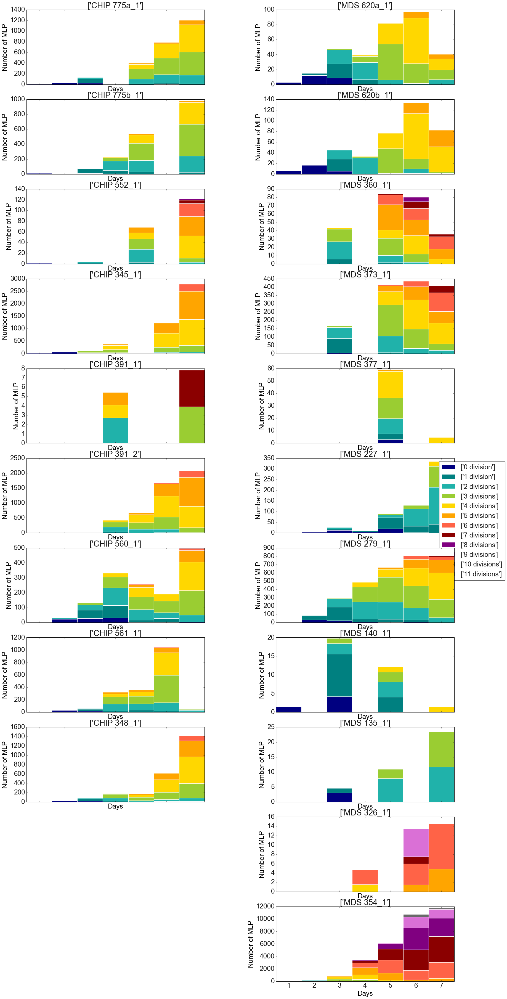

<Figure size 640x480 with 0 Axes>

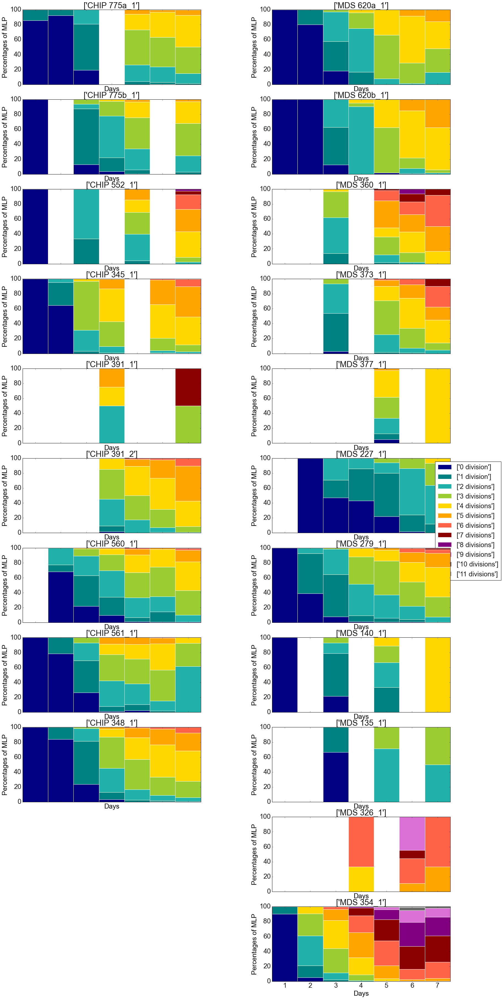

<Figure size 640x480 with 0 Axes>

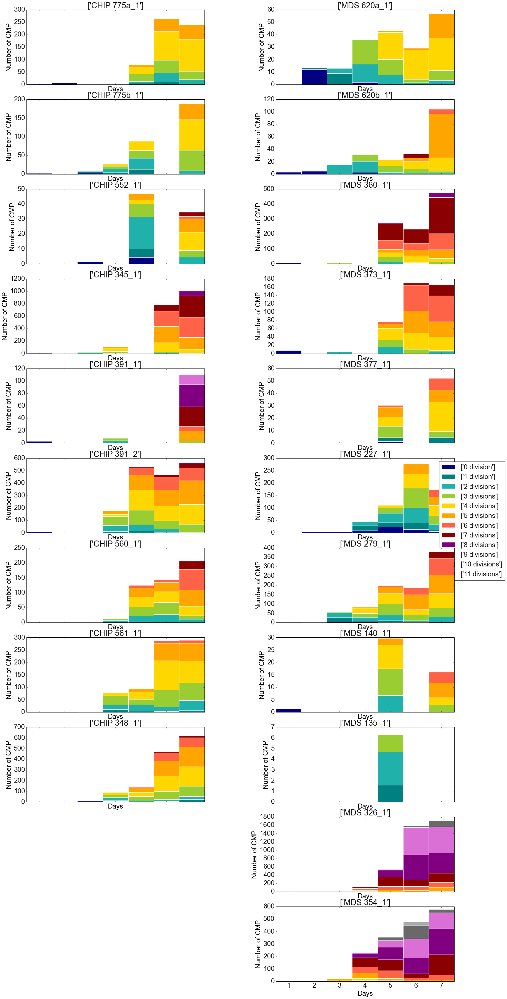

<Figure size 640x480 with 0 Axes>

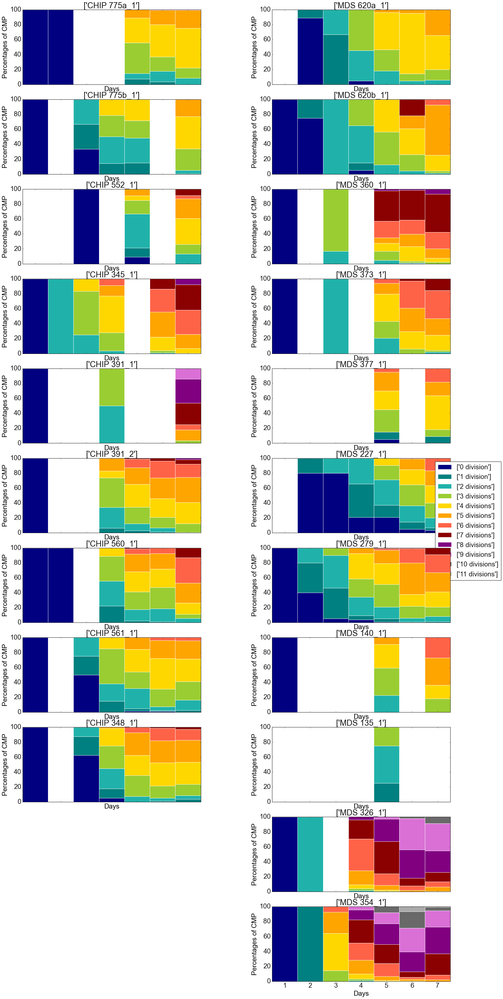

<Figure size 640x480 with 0 Axes>

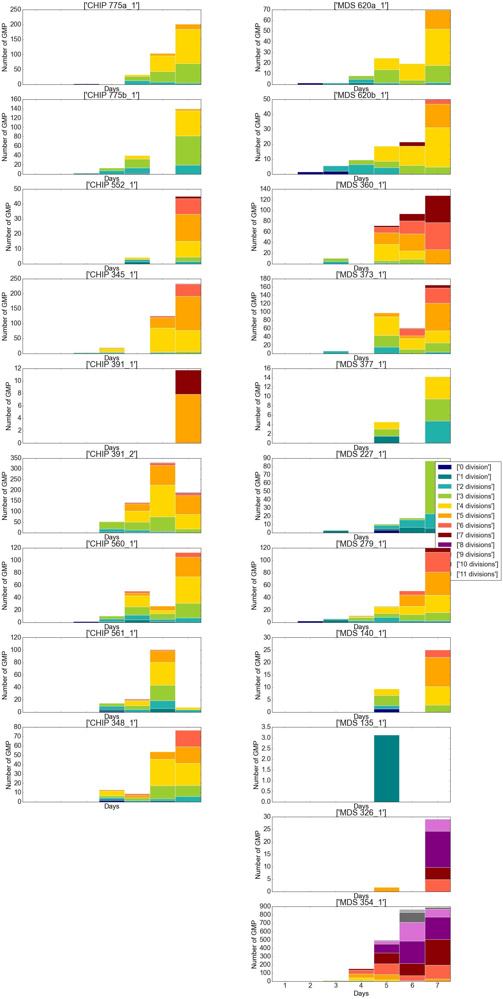

<Figure size 640x480 with 0 Axes>

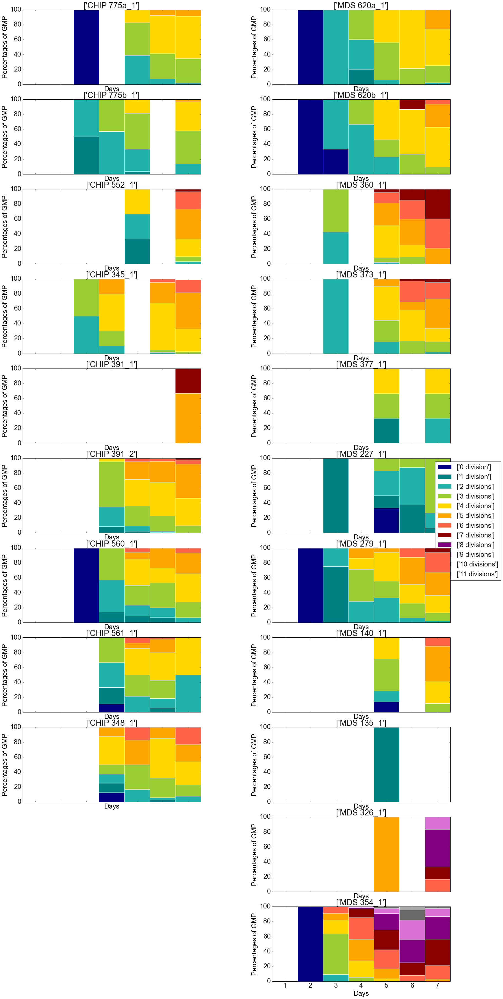

<Figure size 640x480 with 0 Axes>

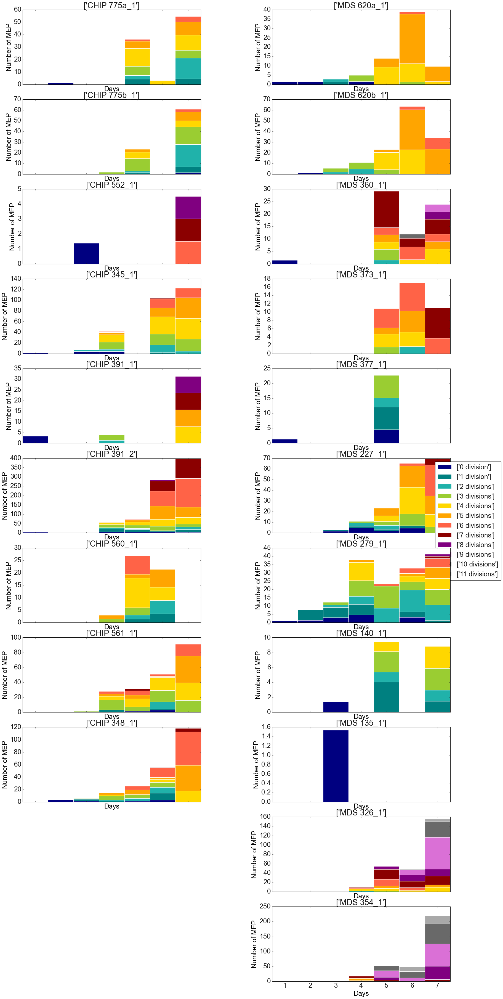

<Figure size 640x480 with 0 Axes>

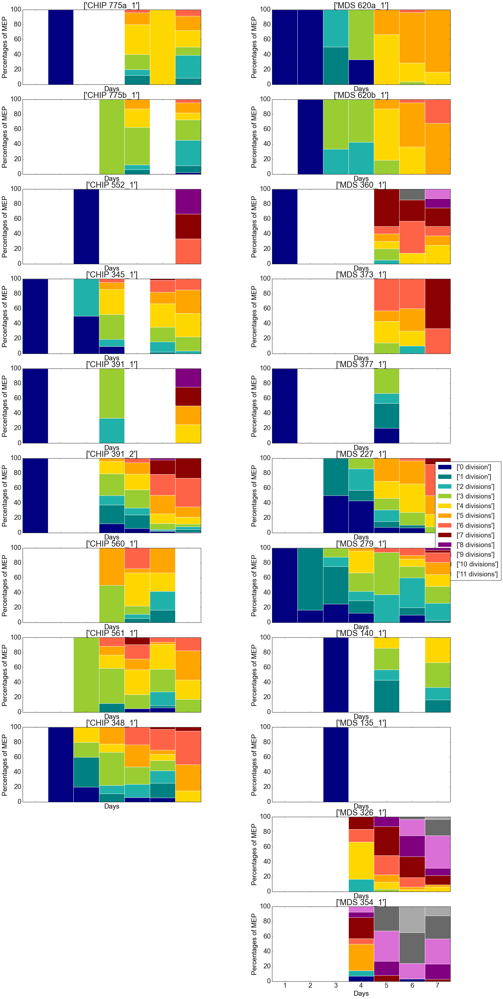

<Figure size 640x480 with 0 Axes>

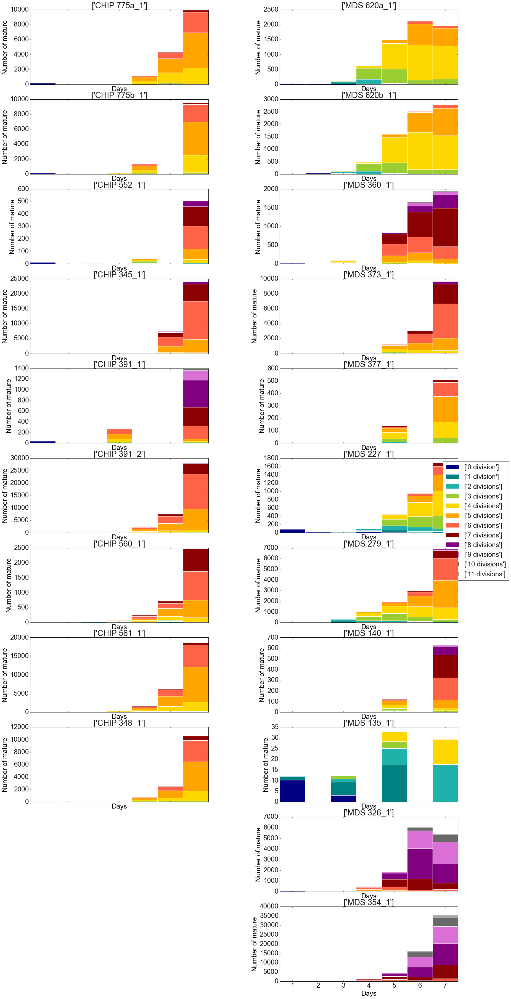

<Figure size 640x480 with 0 Axes>

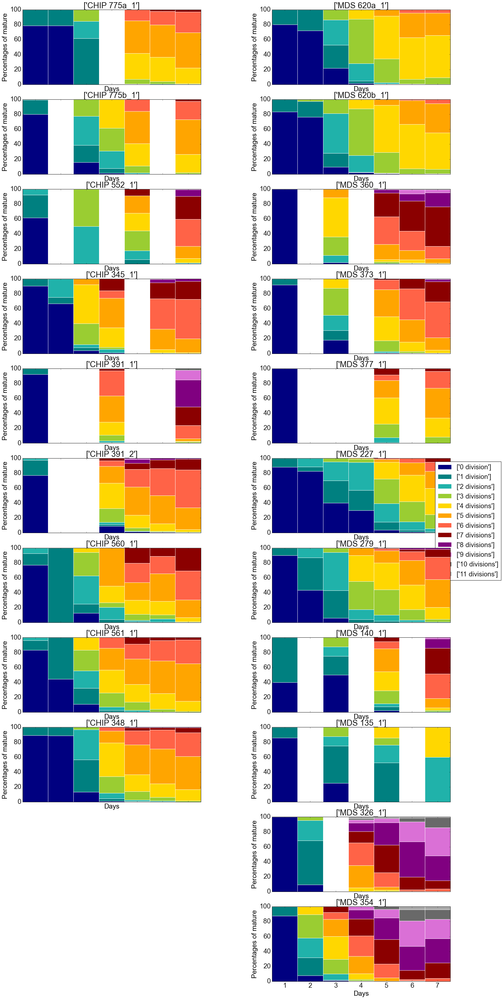

<Figure size 640x480 with 0 Axes>

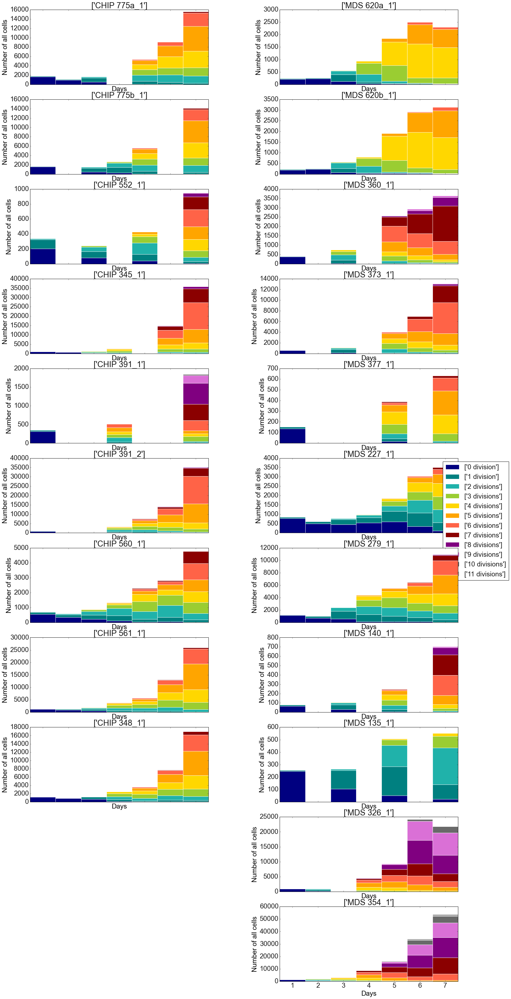

<Figure size 640x480 with 0 Axes>

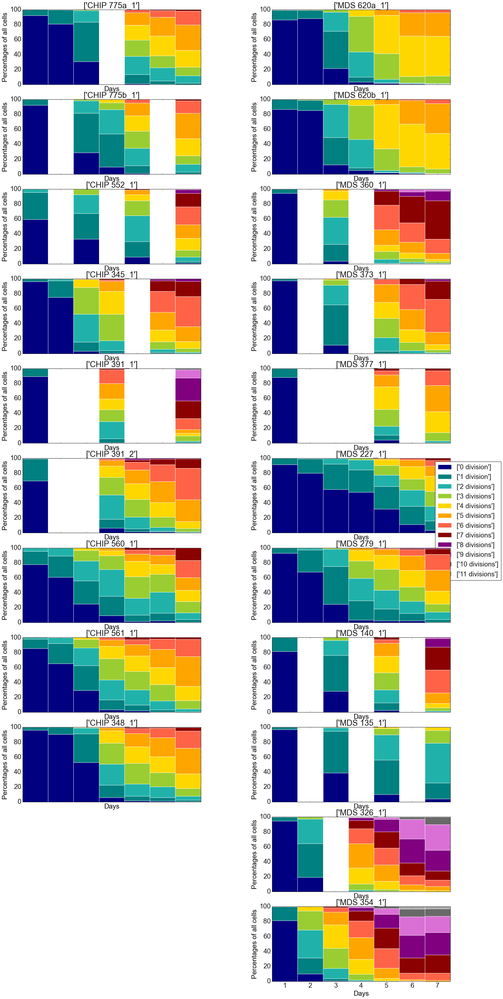

<Figure size 640x480 with 0 Axes>

In [87]:
loadPltSettings(22,20) #fontSize,markerSize
for CT in CT_str:
    plot_number_of_divisions_vs_time_for_CT(CT,df,df_divs_all,['CHIP','MDS'],cols_divisions,'absoluteNumbers',opt_save)
    plot_number_of_divisions_vs_time_for_CT(CT,df,df_divs_all,['CHIP','MDS'],cols_divisions,'percentages',opt_save)
    #plot_number_of_divisions_vs_time_for_CT(CT,df,df_divs_all,['healthy young','healthy aged'],cols_divisions,'absoluteNumbers',opt_save)
    #plot_number_of_divisions_vs_time_for_CT(CT,df,df_divs_all,['healthy young','healthy aged'],cols_divisions,'percentages',opt_save)

### Percentage of HSCs that have not divided vs. time (a dot for each sample, color coded for Status_detailed)

In [67]:
loadPltSettings(20,10) #fontSize,markerSize

<module 'matplotlib.pyplot' from 'C:\\Users\\PowerWS\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

healthy young
healthy aged


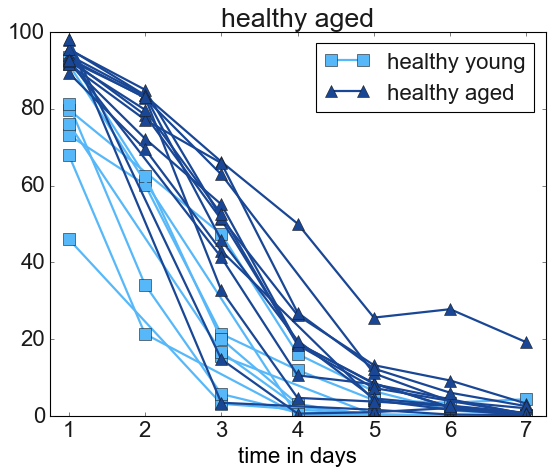

<Figure size 640x480 with 0 Axes>

In [68]:
plot_percentage_nondivided_HSCs(df,df_divs_all,['healthy young','healthy aged'],cols_H_y_vs_H_a,[marker_H_y,marker_H_a],False,mutation_str,opt_save)

healthy age-matched
MDS


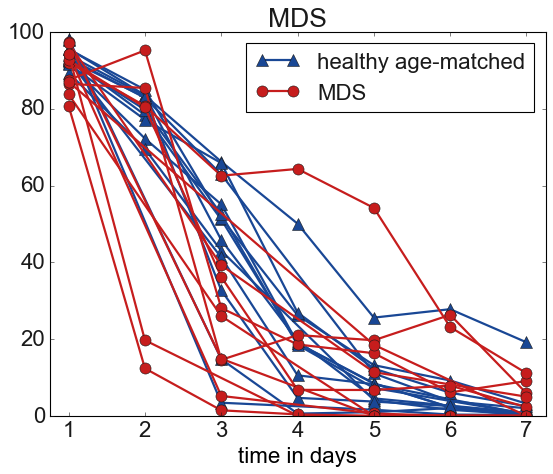

<Figure size 640x480 with 0 Axes>

In [69]:
plot_percentage_nondivided_HSCs(df,df_divs_all,['healthy age-matched','MDS'],cols_H_vs_MDS,[marker_H_a,marker_MDS],False,mutation_str,opt_save)

healthy age-matched
CHIP
MDS


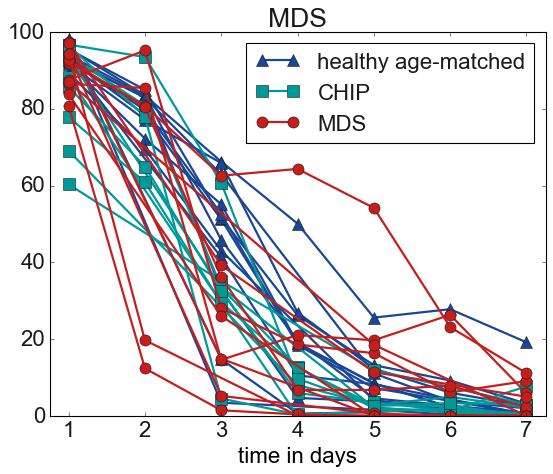

<Figure size 640x480 with 0 Axes>

In [70]:
plot_percentage_nondivided_HSCs(df,df_divs_all,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,[marker_H_a,marker_CHIP,marker_MDS],False,mutation_str,opt_save)

### Percentage of HSCs completed 1st division (comparison to Shepherd et al. 2018)

#### Comparison of young healthy (Age<60, light blue) and aged healthy (Age>=60, dark blue)

In [82]:
df.head()

,filename,Tag,counts_total,counts_beads,counts_sample,p0,p1,p2,viable,lin_neg,...,SETBP1_VAF,IDH2_VAF,GATA1_VAF,TP53_VAF,STAG2_VAF,WT1_VAF,KRAS_VAF,NFE2_VAF,Mutation_counts,Status_detailed
0,20200505H607aT1.fcs,1,35714,31011,1523,1357,1336,1303,1189,1904.163039,...,0,0,0,0,0,0,0,0,0,healthy aged
1,20200505H607bT1.fcs,1,36910,32834,1468,1345,1333,1309,1217,1842.602181,...,0,0,0,0,0,0,0,0,0,healthy aged
2,20200505H607aT2.fcs,2,38119,33490,1285,1160,1111,1071,999,1488.504031,...,0,0,0,0,0,0,0,0,0,healthy aged
3,20200505H607bT2.fcs,2,36944,31899,1369,1202,1142,1079,1034,1620.740462,...,0,0,0,0,0,0,0,0,0,healthy aged
4,20200505H607aT3.fcs,3,32631,28150,1597,1426,1228,1142,967,1699.822380,...,0,0,0,0,0,0,0,0,0,healthy aged


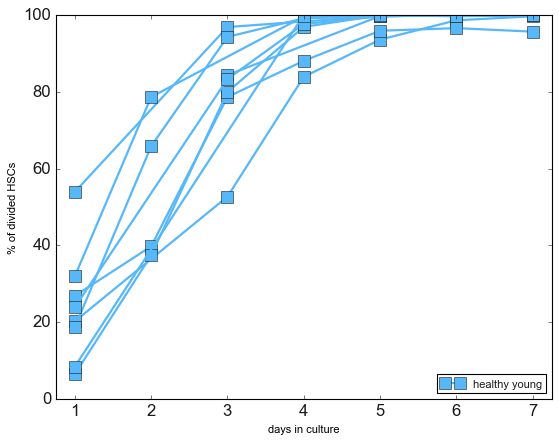

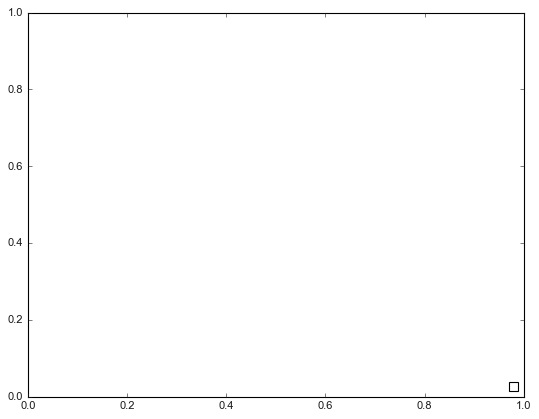

<Figure size 640x480 with 0 Axes>

In [80]:
add_file_str='H_young_vs_H_aged'
plot_percentage_of_HSCs_which_completed_nth_division(df,df_divs_all,['healthy young','healthy aged'],cols_H_y_vs_H_a,[marker_H_y,marker_H_a],1,False,add_file_str,opt_save)

#### Comparison of age matched healthy & MDS 

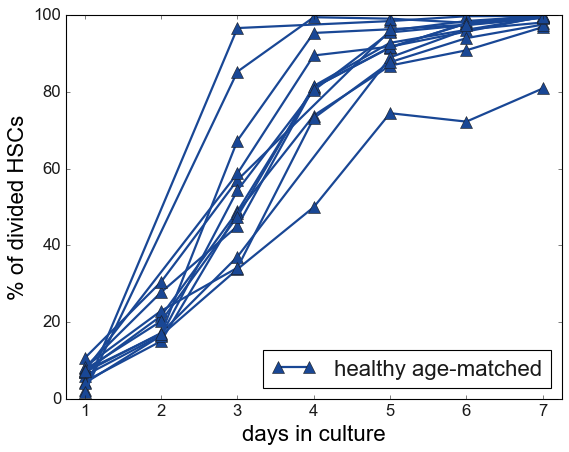

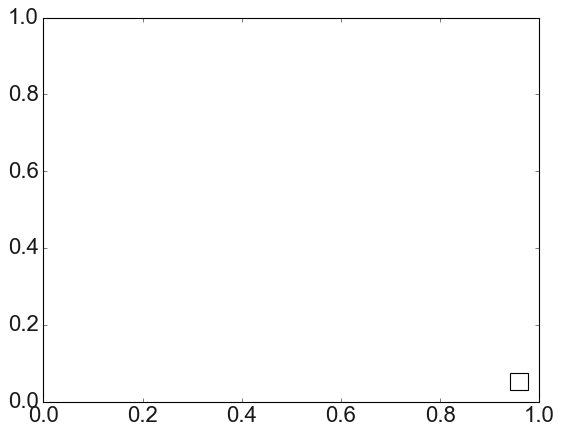

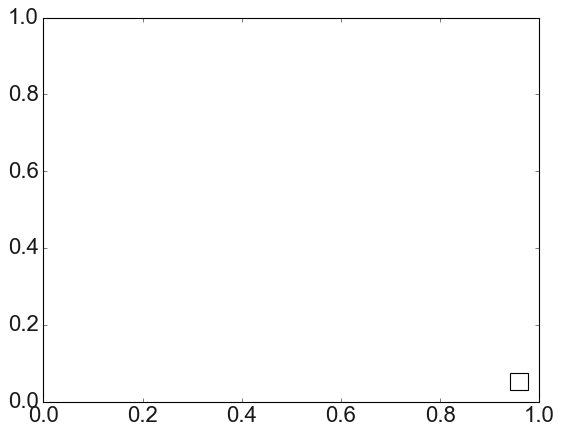

<Figure size 640x480 with 0 Axes>

In [72]:
add_file_str='H_agematched_vs_CHIP_vs_MDS'
plot_percentage_of_HSCs_which_completed_nth_division(df,df_divs_all,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,[marker_H_a,marker_CHIP,marker_MDS],1,False,add_file_str,opt_save)

### Percentage of HSCs completed 2nd division (comparison to Shepherd et al. 2018)

#### Comparison of young healthy (Age<60, light blue), aged healthy (Age>=60, dark blue) and MDS (red) 

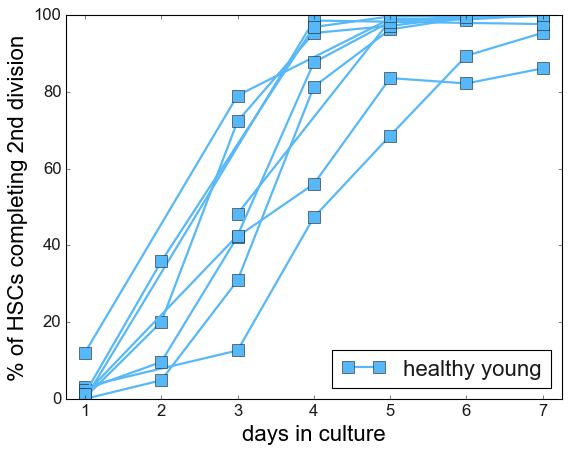

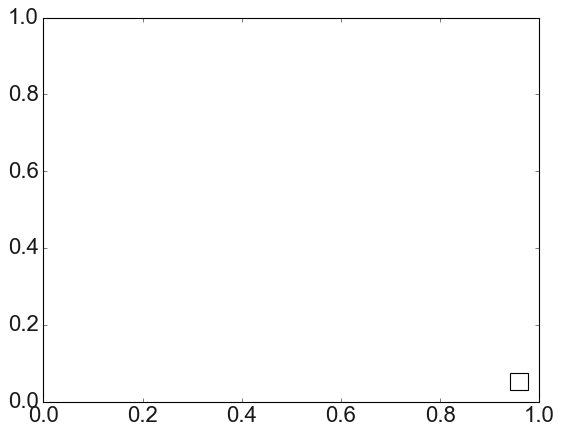

<Figure size 640x480 with 0 Axes>

In [73]:
add_file_str='H_young_vs_H_aged'
plot_percentage_of_HSCs_which_completed_nth_division(df,df_divs_all,['healthy young','healthy aged'],cols_H_y_vs_H_a,[marker_H_y,marker_H_a],2,False,add_file_str,opt_save)

#### Comparison of age matched healthy & MDS 

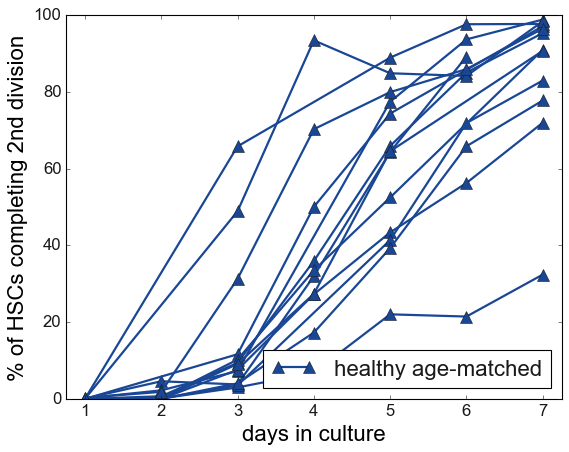

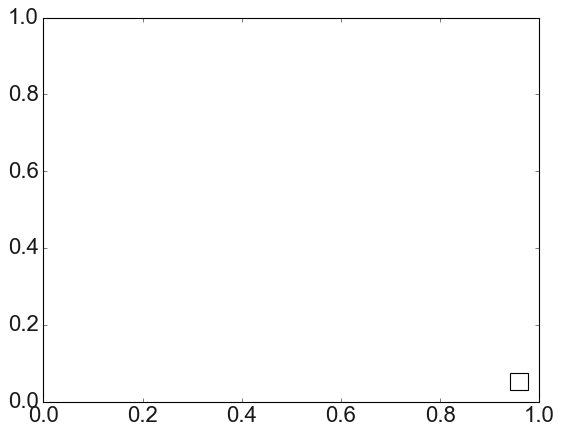

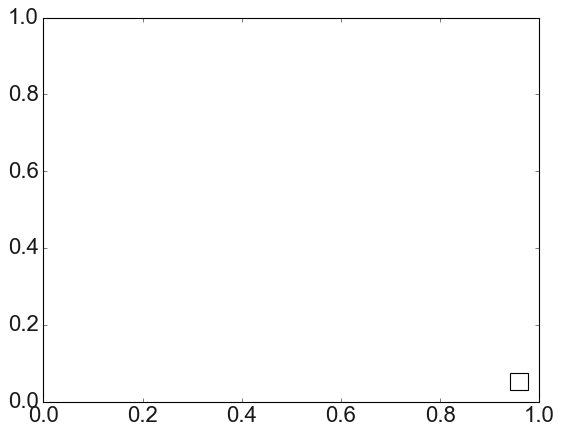

<Figure size 640x480 with 0 Axes>

In [74]:
add_file_str='H_agematched_vs_CHIP_vs_MDS'
plot_percentage_of_HSCs_which_completed_nth_division(df,df_divs_all,['healthy age-matched','CHIP','MDS'],cols_H_vs_CHIP_vs_MDS,[marker_H_a,marker_CHIP,marker_MDS],2,False,add_file_str,opt_save)

### Violinplot grouped by Status for each day and cell type:

In [75]:
path = os.getcwd()
os.chdir(path)
%run "defined_functions.ipynb"

In [76]:
loadPltSettings(10,10)

<module 'matplotlib.pyplot' from 'C:\\Users\\PowerWS\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [77]:
np.unique(df_divs_F_all['Group'])

array(['CHIP', 'MDS', 'healthy', 'healthy age-matched', 'healthy aged',
       'healthy young'], dtype=object)

In [78]:
G=['healthy age-matched','MDS']
G[0]

'healthy age-matched'

In [83]:
df_divs_F_1 = df_divs_F_all[df_divs_F_all['Group']==G[0]].copy()
df_divs_F_2 = df_divs_F_all[df_divs_F_all['Group']==G[1]].copy()
df_div_freq = pd.concat([df_divs_F_1,df_divs_F_2])
np.unique(df_div_freq['Group'])

array(['MDS', 'healthy age-matched'], dtype=object)

ValueError: There must be exactly two hue levels to use `split`.'

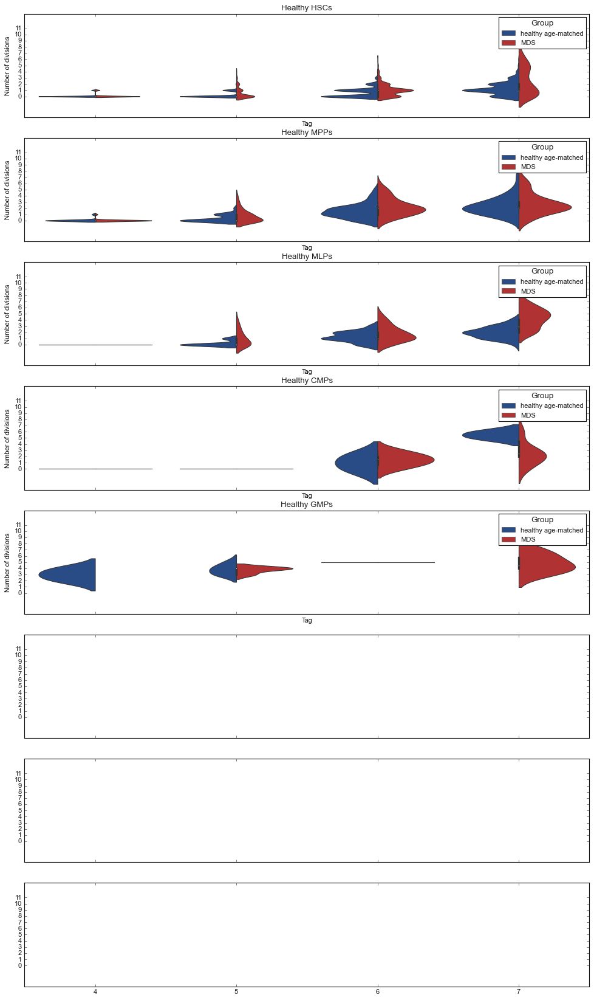

In [84]:
plotDivisionDistributionsAsViolins(df_divs_F_all,CT_str,['healthy age-matched','MDS'],cols_H_vs_MDS,opt_save)

In [ ]:
plotDivisionDistributionsAsViolins(df_divs_F_all,CT_str,['CHIP','MDS'],cols_H_y_vs_MDS,opt_save)

In [ ]:
plotDivisionDistributionsAsViolins(df_divs_F_all,CT_str,['healthy young','healthy aged'],cols_H_y_vs_H_a,opt_save)

### Division distribution as barplots

In [ ]:
plotDivisionDistributionAsBars(df_divs_all,CT_str,['healthy age-matched','MDS'],cols_H_vs_MDS_light,cols_H_vs_MDS,opt_save)

C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
C:\Users\PowerWS\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used toget

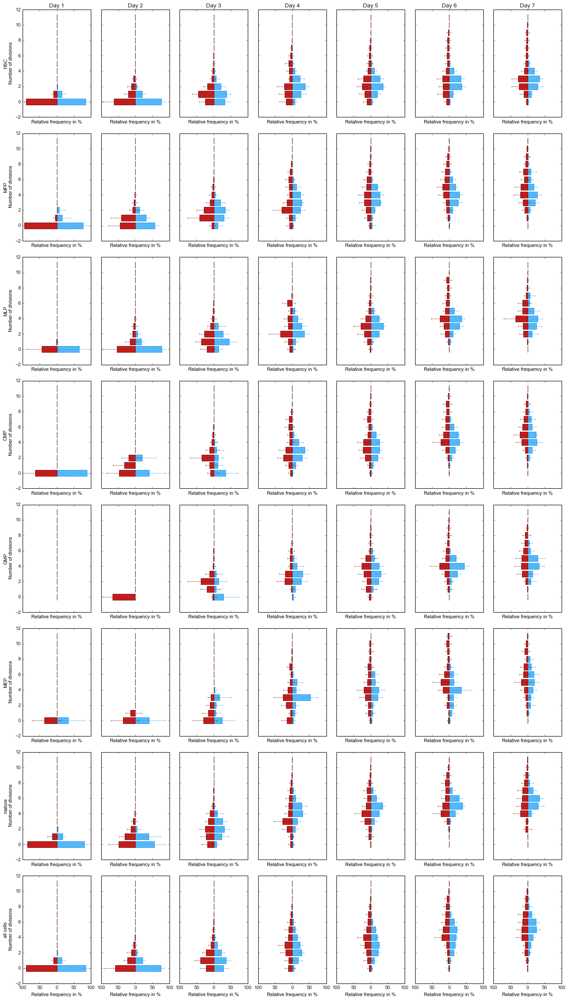

<Figure size 640x480 with 0 Axes>

In [85]:
plotDivisionDistributionAsBars(df_divs_all,CT_str,['CHIP','MDS'],cols_H_y_vs_MDS_light,cols_H_y_vs_MDS,opt_save)

In [ ]:
plotDivisionDistributionAsBars(df_divs_all,CT_str,['healthy young','healthy aged'],cols_H_y_vs_H_a_light,cols_H_y_vs_H_a,opt_save)

--> for every cell type and every day, the observed cell counts were normalized by the total number of cells observed at day 0.